In [23]:
import os,sys,inspect
currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0,parentdir) 

from torch.utils.data import DataLoader
import tools.dataloader as dl
import tools.metrics as met
import tools.FSD as fsd
import matplotlib.pyplot as plt
import model.architecture as arc
import torch
import torchvision.models as models
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torchvision.transforms.functional as TF
import numpy as np
from PIL import Image
from torchvision.models.segmentation.deeplabv3 import DeepLabHead
from torchvision.models.segmentation.fcn import FCNHead

## New Models x2

In [15]:
path = '../model/weights/UNET continuous learninig/' + "96_UNET_200iter_0.5BCE.mdl"
loss="BCE"
if loss == "MSE":
    thresh = 0.5
else:
    thresh = 0
file = torch.load(file_path)
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())         
model = arc.ResUNet(layers, 1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/test_premade_patches_multi/image_patches/'
path_masks = '../data/test_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    if batch_idx==0:
        break

In [22]:
X = np.stack((X,)*3, axis=-1)
X.shape

(192, 192, 3)

In [26]:
def RES_UNET(file_path, loss="BCE", plot=False, verbose=True):
    if loss == "MSE":
        thresh = 0.5
    else:
        thresh = 0
    file = torch.load(file_path)
    resnet = models.resnet34(pretrained=True)
    layers = list(resnet.children())         
    model = arc.ResUNet(layers, 1)
    model.load_state_dict(file['state_dict'])
    model.eval()
    model.cuda()
    path_images = '../data/valid_premade_patches_multi/image_patches/'
    path_masks = '../data/valid_premade_patches_multi/mask_patches/'
    #path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
    #path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs, mAccs, pres, recs = [], [], [], []
    areas_mask_final, areas_pred_final = [], []

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        #print("before: ", np.max(X), np.min(X))
        #X = X[:,:,0].astype(np.float32)
        #X = -(X) + 255
        X = np.stack((X,)*3, axis=-1)
        X = X[:, :, :3]
        #X = X * 255
        #print("after: ", np.max(X), np.min(X))
        #X = np.array(X[:, :, 0])
        X = TF.to_tensor(X).unsqueeze(0).cuda()
        #print(X.shape)
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        #X = X[:,0,:,:].unsqueeze(1)
        pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > thresh)
        #print(y, pred)
        #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        #    ax2.imshow(y)
        #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
        #    plt.colorbar(preds,fraction=0.046, pad=0.04)
        #    ax4.imshow(pred)
        pre, rec = met.precision_recall(y, pred)
        mIoUs.append(met.mIoU(y, pred))
        mAccs.append(met.mAcc(y, pred))
        pres.append(pre)
        recs.append(rec)

        _, areas_mask = met.get_centres(y, get_areas=True)
        _, areas_pred = met.get_centres(pred, get_areas=True)

        areas_mask_final += list(areas_mask)
        areas_pred_final += list(areas_pred)
        #plt.colorbar(preds,fraction=0.046, pad=0.04)
        #preds.set_clim(-6,6)
        #if batch_idx == 10:
        #    break

    if verbose:
        print('Model: 384_resUNET_200iter_0.5BCE.mdl')    
        print("IoU: {}".format(np.mean(mIoUs)))
        print("Accuracy: {}".format(np.mean(mAccs)))
        print("Precision: {}".format(np.mean(pres)))
        print("Recall: {}".format(np.mean(recs)))
        print("\n")
    if plot:
        bin_size = 50
        bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
        bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
        plt.legend()
        plt.show()
    
    return [np.mean(mIoUs), np.mean(mAccs), np.mean(pres), np.mean(recs)]

def UNET(file_path, loss="BCE", plot=False, verbose=True):
    if loss == "MSE":
        thresh = 0.5
    else:
        thresh = 0
    file = torch.load(file_path)
    model = arc.UNet(1)
    model.load_state_dict(file['state_dict'])
    model.eval()
    model.cuda()
    path_images = '../data/valid_premade_patches_multi/image_patches/'
    path_masks = '../data/valid_premade_patches_multi/mask_patches/'
    #path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
    #path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs, mAccs, pres, recs = [], [], [], []
    areas_mask_final, areas_pred_final = [], []

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        #print("before: ", np.max(X), np.min(X))
        #X = X[:,:,0]#.astype(np.float32)
        #X = X * 255
        #print("after: ", np.max(X), np.min(X))
        #X = np.array(X[:, :, 0])
        X = TF.to_tensor(X).unsqueeze(0).cuda()
        #print(X.shape)
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        #X = X[:,0,:,:].unsqueeze(1)
        pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > thresh)
        #print(y, pred)
        #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        #    ax2.imshow(y)
        #    ax2.set_title("Ground Truth")
        #    preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
        #    plt.colorbar(preds,fraction=0.046, pad=0.04)
        #    ax3.imshow(pred)
        #    ax3.set_title("Thresholded Prediction")
        #    ax4.set_title("Prediction")
        #    ax1.set_title("Patch")
        pre, rec = met.precision_recall(y, pred)
        mIoUs.append(met.mIoU(y, pred))
        mAccs.append(met.mAcc(y, pred))
        pres.append(pre)
        recs.append(rec)

        _, areas_mask = met.get_centres(y, get_areas=True)
        _, areas_pred = met.get_centres(pred, get_areas=True)

        areas_mask_final += list(areas_mask)
        areas_pred_final += list(areas_pred)
        #plt.colorbar(preds,fraction=0.046, pad=0.04)
        #preds.set_clim(-6,6)
        #if batch_idx == 10:
        #    break

    if verbose:
        print('Model: 384_UNET_200iter_0.5BCE.mdl')    
        print("IoU: {}".format(np.mean(mIoUs)))
        print("Accuracy: {}".format(np.mean(mAccs)))
        print("Precision: {}".format(np.mean(pres)))
        print("Recall: {}".format(np.mean(recs)))
        print("\n")
    if plot:
        bin_size = 50
        bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
        bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
        plt.legend()
        plt.show()
        
    return [np.mean(mIoUs), np.mean(mAccs), np.mean(pres), np.mean(recs)]

def DEEP_LAB(file_path, loss="BCE", plot=False, verbose=True):
    if loss == "MSE":
        thresh = 0.5
    else:
        thresh = 0
        
    model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
    model = models.segmentation.deeplabv3_resnet101(pretrained=True)
    model.classifier = DeepLabHead(2048, 1)
    model.load_state_dict(torch.load(file_path)['state_dict'])
    model.eval()
    model.cuda()
    path_images = '../data/test_premade_patches_multi/image_patches/'
    path_masks = '../data/test_premade_patches_multi/mask_patches/'
    #path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
    #path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs, mAccs, pres, recs = [], [], [], []
    areas_mask_final, areas_pred_final = [], []

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        #print("before: ", np.max(X), np.min(X))
        #X = X[:,:,0].astype(np.float32)
        #X = -(X) + 255
        X = np.stack((X,)*3, axis=-1)
        X = X[:, :, :3]
        #X = X * 255
        #print("after: ", np.max(X), np.min(X))
        #X = np.array(X[:, :, 0])
        X = TF.to_tensor(X).unsqueeze(0).cuda()
        #print(X.shape)
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        #X = X[:,0,:,:].unsqueeze(1)
        pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > thresh)
        #print(y, pred)
        #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        #    ax2.imshow(y)
        #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
        #    plt.colorbar(preds,fraction=0.046, pad=0.04)
        #    ax4.imshow(pred)
        pre, rec = met.precision_recall(y, pred)
        mIoUs.append(met.mIoU(y, pred))
        mAccs.append(met.mAcc(y, pred))
        pres.append(pre)
        recs.append(rec)

        _, areas_mask = met.get_centres(y, get_areas=True)
        _, areas_pred = met.get_centres(pred, get_areas=True)

        areas_mask_final += list(areas_mask)
        areas_pred_final += list(areas_pred)
        #plt.colorbar(preds,fraction=0.046, pad=0.04)
        #preds.set_clim(-6,6)
        #if batch_idx == 10:
        #    break

    if verbose:
        print('Model: 1_192_DLv3_200iter_MSE.mdl')    
        print("IoU: {}".format(np.mean(mIoUs)))
        print("Accuracy: {}".format(np.mean(mAccs)))
        print("Precision: {}".format(np.mean(pres)))
        print("Recall: {}".format(np.mean(recs)))
        print("\n")
    if plot:
        bin_size = 50
        bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
        bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
        plt.legend()
        plt.show()
    
    return [np.mean(mIoUs), np.mean(mAccs), np.mean(pres), np.mean(recs)]

In [ ]:
def RES_UNET(file_path, file2_path loss="BCE", plot=False, verbose=True):
    if loss == "MSE":
        thresh = 0.5
    else:
        thresh = 0.5
    file = torch.load(file_path)
    resnet = models.resnet34(pretrained=True)
    layers = list(resnet.children())         
    model = arc.ResUNet(layers, 1)
    model.load_state_dict(file['state_dict'])
    
    model.eval()
    model.cuda()
    path_images = '../data/valid_premade_patches_multi/image_patches/'
    path_masks = '../data/valid_premade_patches_multi/mask_patches/'

    img_names = os.listdir(path_images)
    msk_names = os.listdir(path_masks)
    mIoUs, mAccs, pres, recs = [], [], [], []
    areas_mask_final, areas_pred_final = [], []

    for batch_idx in range(len(img_names)):
        X = mpimg.imread(path_images + img_names[batch_idx])
        #print("before: ", np.max(X), np.min(X))
        #X = X[:,:,0].astype(np.float32)
        #X = -(X) + 255
        X = np.stack((X,)*3, axis=-1)
        X = X[:, :, :3]
        #X = X * 255
        #print("after: ", np.max(X), np.min(X))
        #X = np.array(X[:, :, 0])
        X = TF.to_tensor(X).unsqueeze(0).cuda()
        #print(X.shape)
        y = Image.open(path_masks + msk_names[batch_idx])
        y = np.array(y).astype(bool)
        #X = X[:,0,:,:].unsqueeze(1)
        pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > thresh)
        #print(y, pred)
        #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        #    ax2.imshow(y)
        #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
        #    plt.colorbar(preds,fraction=0.046, pad=0.04)
        #    ax4.imshow(pred)
        pre, rec = met.precision_recall(y, pred)
        mIoUs.append(met.mIoU(y, pred))
        mAccs.append(met.mAcc(y, pred))
        pres.append(pre)
        recs.append(rec)

        _, areas_mask = met.get_centres(y, get_areas=True)
        _, areas_pred = met.get_centres(pred, get_areas=True)

        areas_mask_final += list(areas_mask)
        areas_pred_final += list(areas_pred)
        #plt.colorbar(preds,fraction=0.046, pad=0.04)
        #preds.set_clim(-6,6)
        #if batch_idx == 10:
        #    break

    if verbose:
        print('Model: 384_resUNET_200iter_0.5BCE.mdl')    
        print("IoU: {}".format(np.mean(mIoUs)))
        print("Accuracy: {}".format(np.mean(mAccs)))
        print("Precision: {}".format(np.mean(pres)))
        print("Recall: {}".format(np.mean(recs)))
        print("\n")
    if plot:
        bin_size = 50
        bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
        bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
        fig, ax = plt.subplots(figsize=(20,8))
        fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
        fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
        plt.legend()
        plt.show()
    
    return [np.mean(mIoUs), np.mean(mAccs), np.mean(pres), np.mean(recs)]

In [10]:
files = ['96_UNET_200iter_0.5BCE.mdl',
        '192_UNET_200iter_0.5BCE.mdl',
        '288_UNET_200iter_0.5BCE.mdl',      
        '384_UNET_200iter_0.5BCE.mdl']
print("model \t \t \t mIoU \t mAcc \t Precision \t Recall")
for file in files:
    file_path = '../model/weights/UNET continuous learninig/' + file
    results = UNET(file_path, verbose=False)
    print(file, results[0], results[1], results[2], results[3])

model 	 	 	 mIoU 	 mAcc 	 Precision 	 Recall
96_UNET_200iter_0.5BCE.mdl 0.5175157411479215 0.8780849692262248 0.17436336958268853 0.8141937144428915
192_UNET_200iter_0.5BCE.mdl 0.6177541978628684 0.9591221204216097 0.2550028112448369 0.7143191912209383
288_UNET_200iter_0.5BCE.mdl 0.5992953682503521 0.9650521285445602 0.3108470519188481 0.4885194108311914
384_UNET_200iter_0.5BCE.mdl 0.6407645883359885 0.979623634432569 0.39039316710245414 0.42508523999151604


In [24]:
files = ['96_resUNET_200iter_0.5BCE.mdl',
        '192_resUNET_200iter_0.5BCE.mdl',
        '288_resUNET_200iter_0.5BCE.mdl',      
        '384_resUNET_200iter_0.5BCE.mdl']
print("model \t \t \t mIoU \t \t mAcc \t \t Precision \t \t Recall")
for file in files:
    file_path = '../model/weights/resUNET continuous training/' + file
    results = RES_UNET(file_path, verbose=False)
    print(file, results[0], results[1], results[2], results[3])

model 	 	 	 mIoU 	 	 mAcc 	 	 Precision 	 	 Recall
96_resUNET_200iter_0.5BCE.mdl 0.662914944759923 0.972326025315273 0.3145447622883062 0.811449106873456
192_resUNET_200iter_0.5BCE.mdl 0.6795525388311736 0.9820003434169439 0.6024404570074445 0.5425115369060685
288_resUNET_200iter_0.5BCE.mdl 0.6814744244610378 0.9815281903302226 0.5053426836283105 0.5457543974535304
384_resUNET_200iter_0.5BCE.mdl 0.6305533206494957 0.980472024988245 0.5585873645007977 0.3633906698996156


In [27]:
files = ['2_96_DLv3_200iter_0.5bce.mdl',
        '2_192_DLv3_200iter_0.5bce.mdl',
        '2_288_DLv3_200iter_0.5bce.mdl',      
        '2_384_DLv3_200iter_0.5bce.mdl']
print("model \t \t \t \t mIoU \t \t mAcc \t \t Precision \t \t Recall")
for file in files:
    file_path = '../model/weights/DLv3/' + file
    results = DEEP_LAB(file_path, verbose=False)
    print(file, results[0], results[1], results[2], results[3])

model 	 	 	 	 mIoU 	 	 mAcc 	 	 Precision 	 	 Recall


Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


2_96_DLv3_200iter_0.5bce.mdl 0.26695246827548513 0.5016649363953389 0.2719054680706343 0.9196784358738685


Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


2_192_DLv3_200iter_0.5bce.mdl 0.6225025793683869 0.9746936543782552 0.38916373143822236 0.44109754141141316


Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


2_288_DLv3_200iter_0.5bce.mdl 0.5685693547569177 0.9571825531382621 0.35715253712678247 0.49090711318928476


Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


2_384_DLv3_200iter_0.5bce.mdl 0.6718428597316549 0.9810500976185739 0.6893366818790223 0.5219084768708088


Model: 384_resUNET_200iter_0.5BCE.mdl
IoU: 0.5919579690021357
Accuracy: 0.9605239924678096
Precision: 0.615203153470324
Recall: 0.24935178665392896




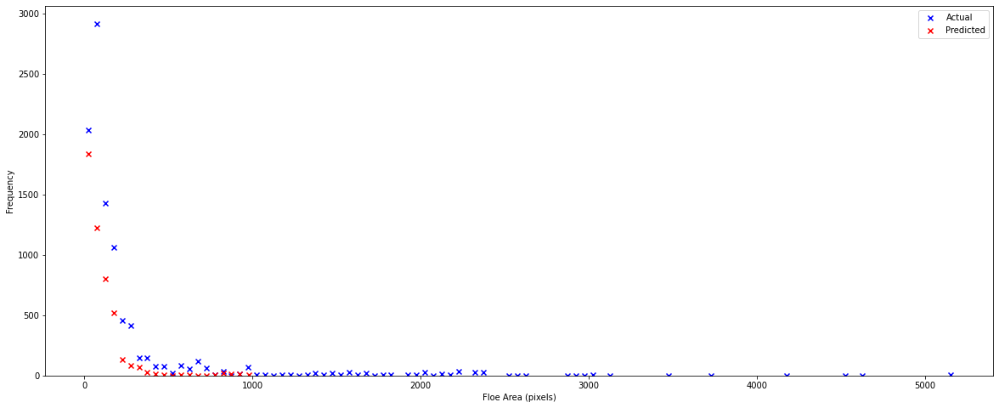

In [19]:
file = torch.load('../model/weights/resUNET continuous training/384_resUNET_200iter_0.5BCE.mdl')
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())         
model = arc.ResUNet(layers, 1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_resUNET_200iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_UNET_200iter_0.5BCE.mdl
IoU: 0.5664701262078643
Accuracy: 0.9583600494008006
Precision: 0.31370316445094254
Recall: 0.24143665503544806




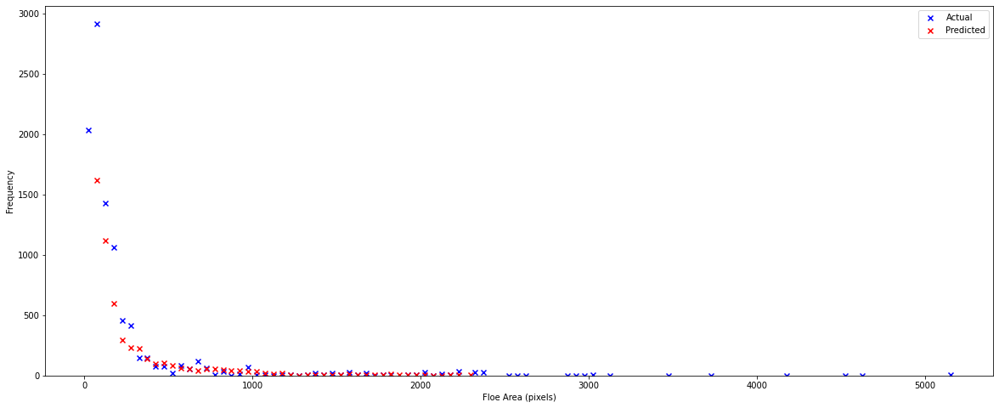

In [11]:
file = torch.load('../model/weights/UNET continuous learninig/384_UNET_200iter_0.5BCE.mdl')
model = arc.UNet(1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0]#.astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    ax2.set_title("Ground Truth")
    #    preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax3.imshow(pred)
    #    ax3.set_title("Thresholded Prediction")
    #    ax4.set_title("Prediction")
    #    ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_UNET_200iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_UNET_200iter_MSE.mdl
IoU: 0.5834392675343066
Accuracy: 0.9471939369484231
Precision: 0.4017337150796931
Recall: 0.4396748796294721




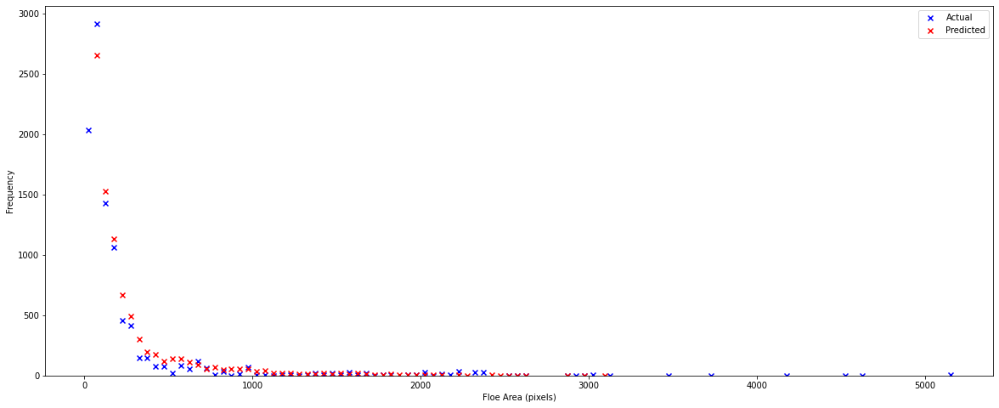

In [7]:
file = torch.load('../model/weights/UNET continuous learninig/384_UNET_200iter_MSE.mdl')
model = arc.UNet(1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0]#.astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    ax2.set_title("Ground Truth")
    #    preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax3.imshow(pred)
    #    ax3.set_title("Thresholded Prediction")
    #    ax4.set_title("Prediction")
    #    ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_UNET_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## New Models Anmol (800 it)

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_192_DLv3_200iter_MSE.mdl
IoU: 0.5527518577829358
Accuracy: 0.9556501704086492
Precision: 0.4949041082759409
Recall: 0.21209767092420484




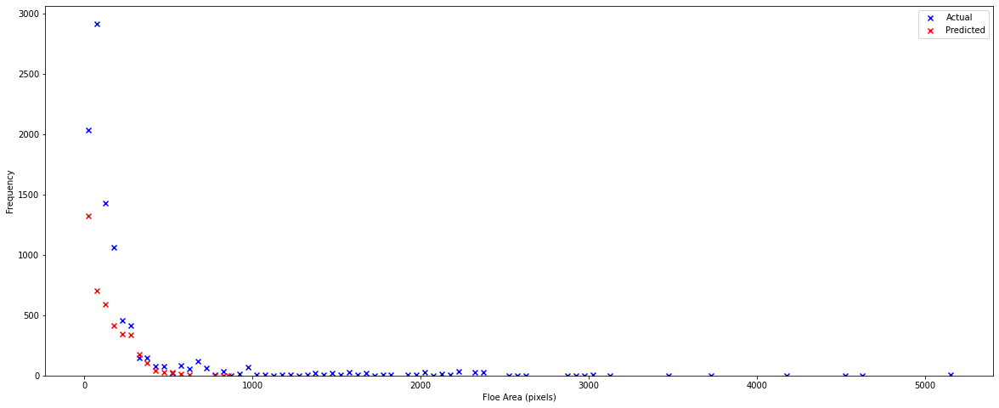

In [35]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/mse/incremental_200iter/1_192_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_192_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

In [37]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/mse/incremental_200iter/1_96_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_96_DLv3_200iter_MSE.mdl
IoU: 0.47643083378891177
Accuracy: 0.9528616615577981
Precision: 0.0
Recall: 0.0




ValueError: zero-size array to reduction operation minimum which has no identity

Model: 384_RESUNET_800iter_0.5BCE.mdl
IoU: 0.5713372352386513
Accuracy: 0.9590520872893157
Precision: 0.5760796656368189
Recall: 0.24052329083360097




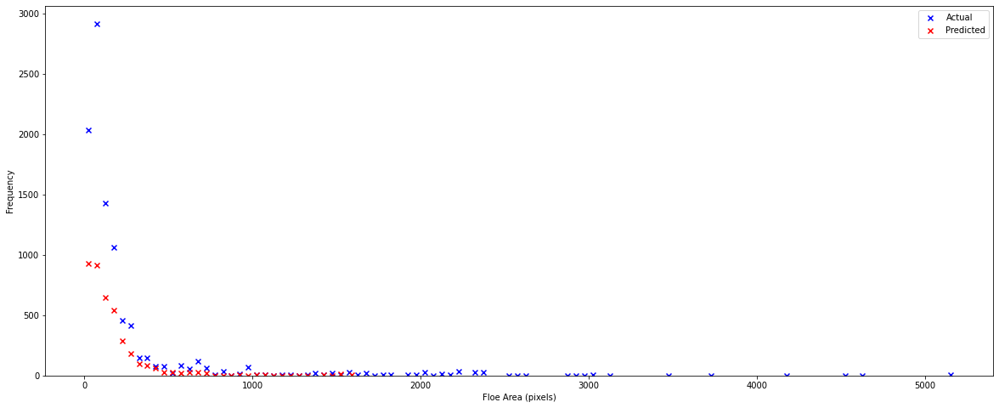

In [28]:
file = torch.load('../model/weights/resnet_BCE/384_RESUNET_800iter_0.5BCE.mdl')
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())         
model = arc.ResUNet(layers, 1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_RESUNET_800iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_RESUNET_800iter_MSE.mdl
IoU: 0.6929488443456243
Accuracy: 0.9728396936110508
Precision: 0.6676465708341902
Recall: 0.4267845209106343




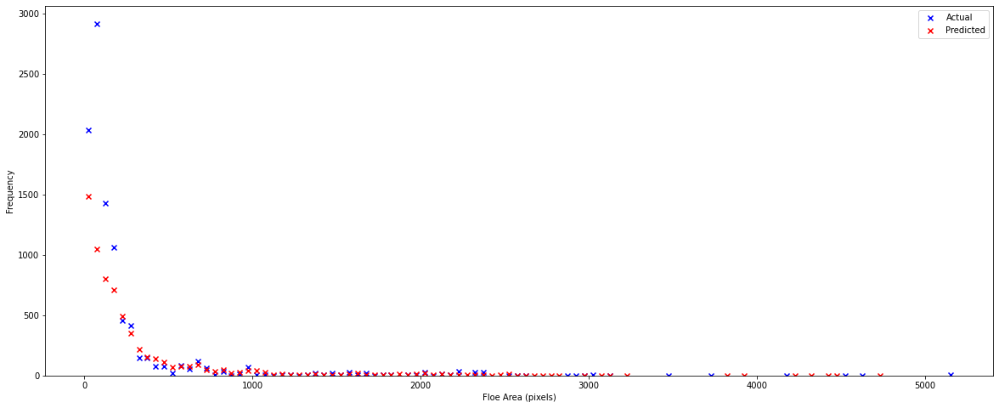

In [27]:
file = torch.load('../model/weights/resnet_mse/384_RESUNET_800iter_MSE.mdl')
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())         
model = arc.ResUNet(layers, 1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_RESUNET_800iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_UNET_800iter_0.5BCE.mdl
IoU: 0.5882056629388215
Accuracy: 0.9458269255838276
Precision: 0.3810428383486121
Recall: 0.3825097033238112




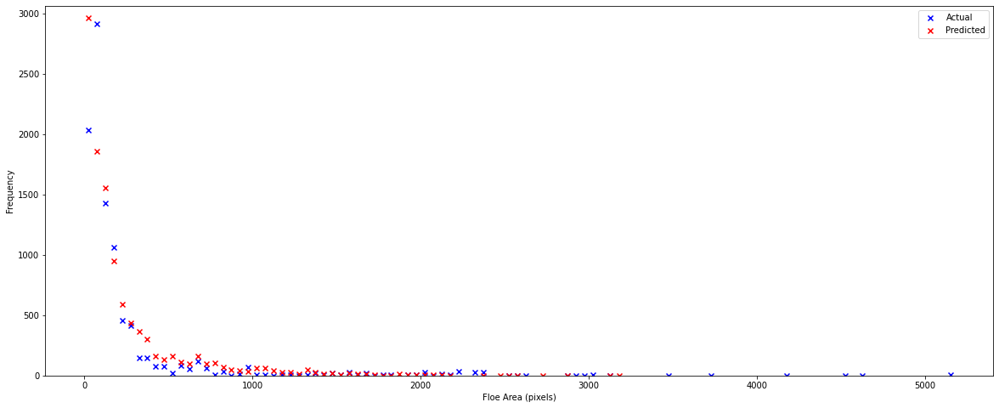

In [30]:
file = torch.load('../model/weights/Unet models/bce/384_UNET_800iter_0.5BCE.mdl')
model = arc.UNet(1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0]#.astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    ax2.set_title("Ground Truth")
    #    preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax3.imshow(pred)
    #    ax3.set_title("Thresholded Prediction")
    #    ax4.set_title("Prediction")
    #    ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_UNET_800iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_UNET_800iter_MSE_BEST_.mdl
IoU: 0.527762905857312
Accuracy: 0.9502589774426119
Precision: 0.3124659383247639
Recall: 0.16696487243544858




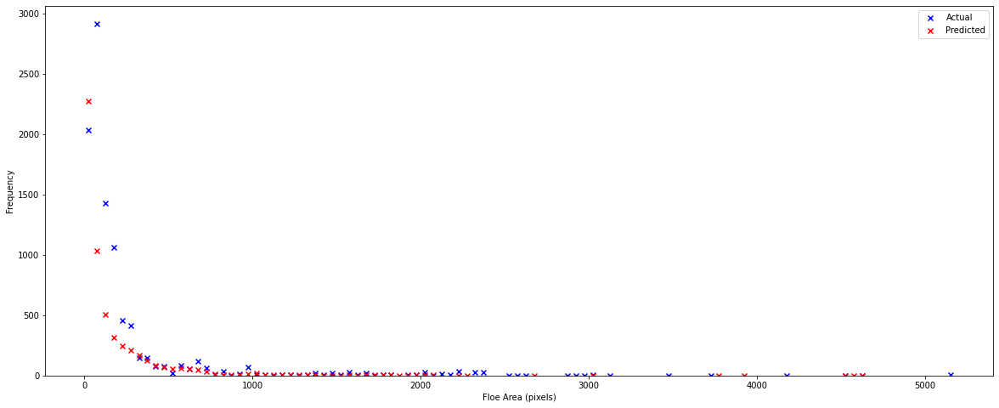

In [31]:
file = torch.load('../model/weights/Unet models/mse/384_UNET_800iter_MSE_BEST_.mdl')
model = arc.UNet(1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0]#.astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    ax2.set_title("Ground Truth")
    #    preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax3.imshow(pred)
    #    ax3.set_title("Thresholded Prediction")
    #    ax4.set_title("Prediction")
    #    ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_UNET_800iter_MSE_BEST_.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 384_DLv3_800iter_0.5BCE.mdl
IoU: 0.6437764088816167
Accuracy: 0.9699157893804857
Precision: 0.6889422315752184
Recall: 0.3248066859928403




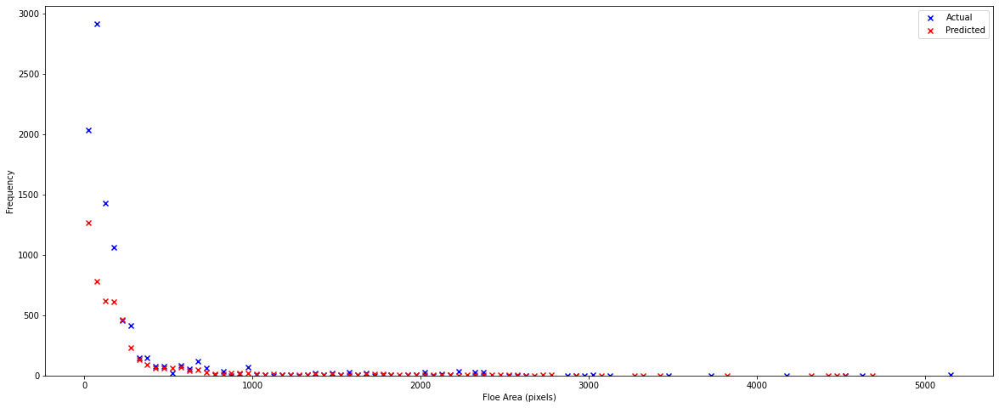

In [11]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/compare/384_DLv3_800iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_DLv3_800iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_384_DLv3_200iter_MSE.mdl
IoU: 0.19293089569690072
Accuracy: 0.3679320224714868
Precision: 0.18806964268836282
Recall: 0.9701935856399367




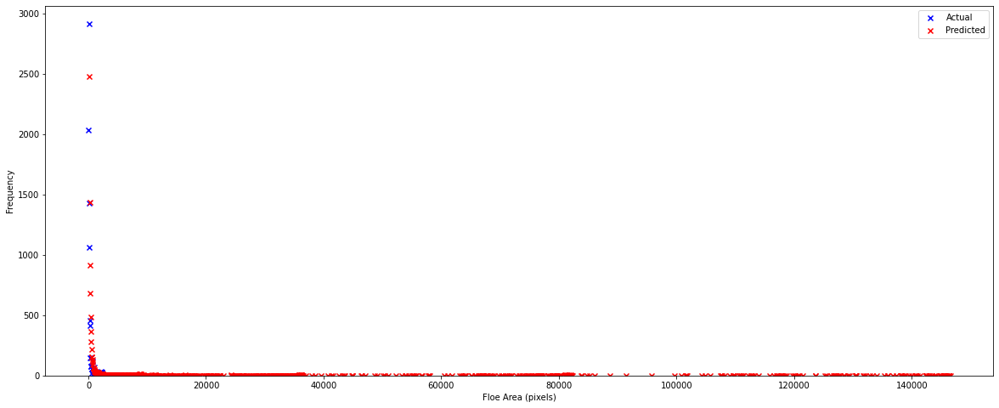

In [20]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/compare/1_384_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_384_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 384_DLv3_800iter_0.5BCE.mdl
IoU: 0.5596572491157469
Accuracy: 0.9612177596857517
Precision: 0.5133045447350583
Recall: 0.16802584875734258




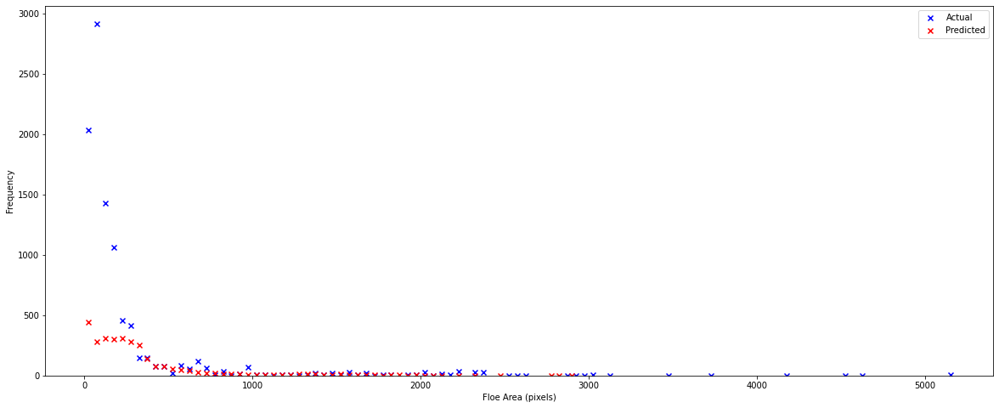

In [19]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/compare/384_DLv3_800iter_0.5BCE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_DLv3_800iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 2_384_DLv3_200iter_0.5bce.mdl
IoU: 0.6157859316992673
Accuracy: 0.9626120324782383
Precision: 0.6905479387764857
Recall: 0.3079524230296294




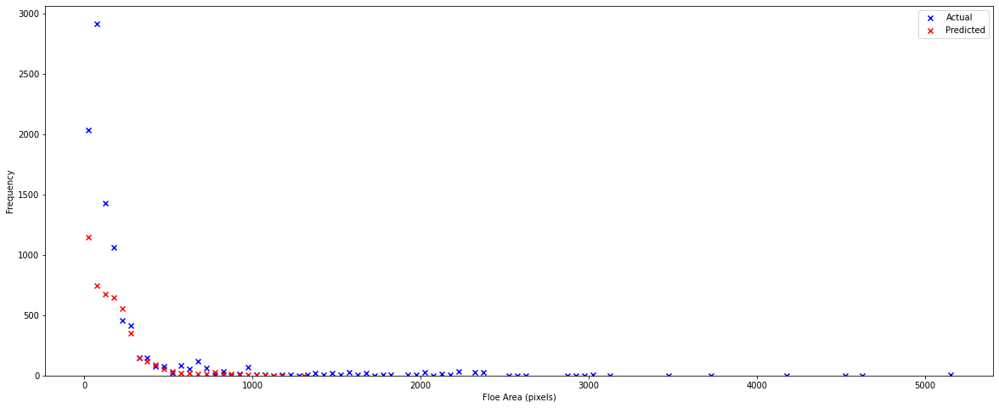

In [18]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/compare/2_384_DLv3_200iter_0.5bce.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 2_384_DLv3_200iter_0.5bce.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 384_FCN_800iter_0.5bce.mdl
IoU: 0.629509334468066
Accuracy: 0.947713315045392
Precision: 0.5495208454645522
Recall: 0.48434036391229796




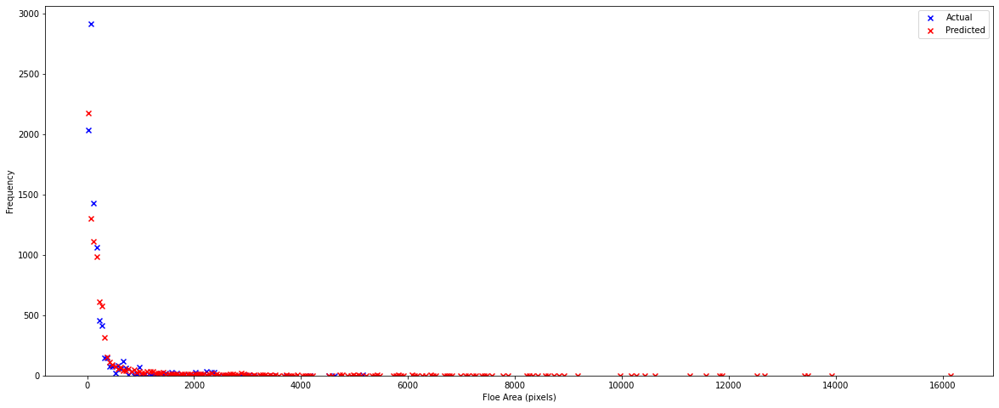

In [3]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/compare/384_FCN_800iter_0.5bce.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 384_FCN_800iter_0.5bce.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_384_FCN_200iter_0.5bce.mdl
IoU: 0.5578216556528711
Accuracy: 0.9562380614104095
Precision: 0.425976716907136
Recall: 0.19870956057609873




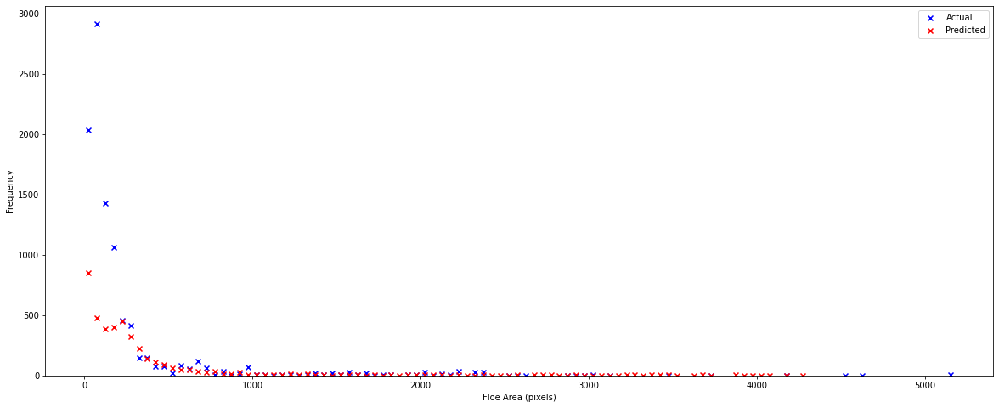

In [7]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/compare/1_384_FCN_200iter_0.5BCE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_384_FCN_200iter_0.5bce.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## FCN

In [2]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Cont_FCN_1000iter_0.5BCE/2_384_FCN_best_model_iter_0.5bce.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

KeyboardInterrupt: 

Model: 1_96_DLv3_200iter_MSE.mdl
IoU: 0.7001647110682218
Accuracy: 0.9678154976413441
Precision: 0.7295384088335415
Recall: 0.4655079543979958




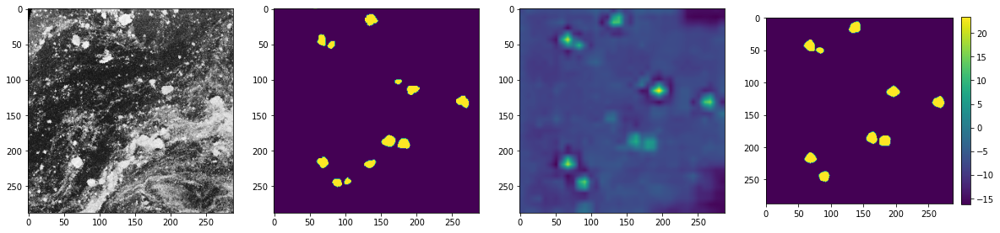

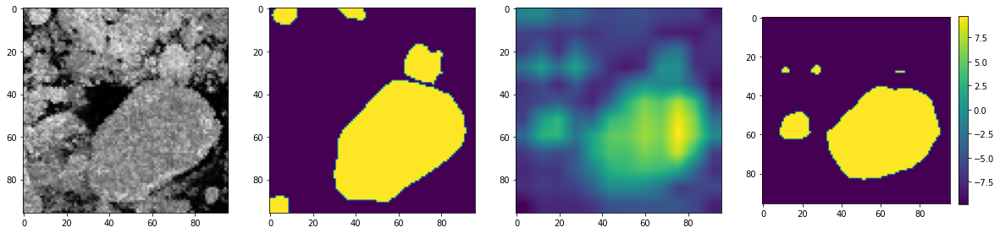

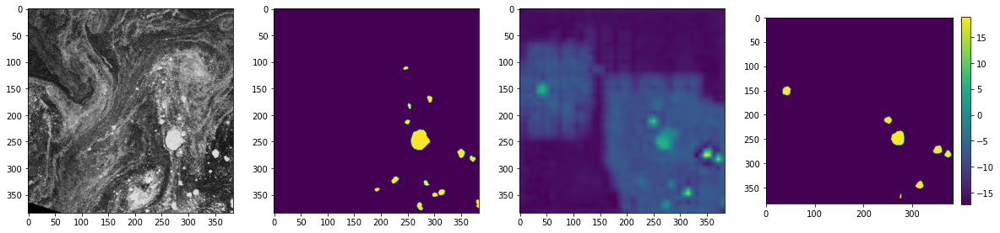

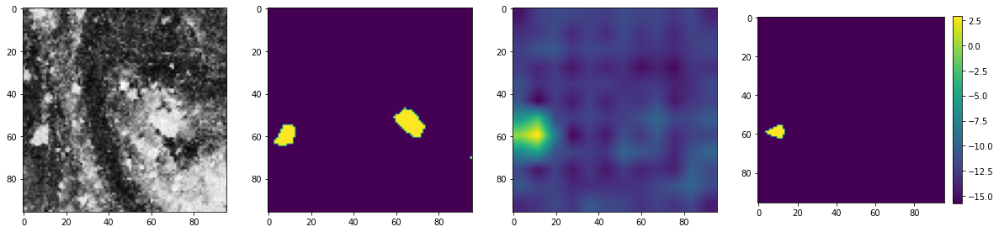

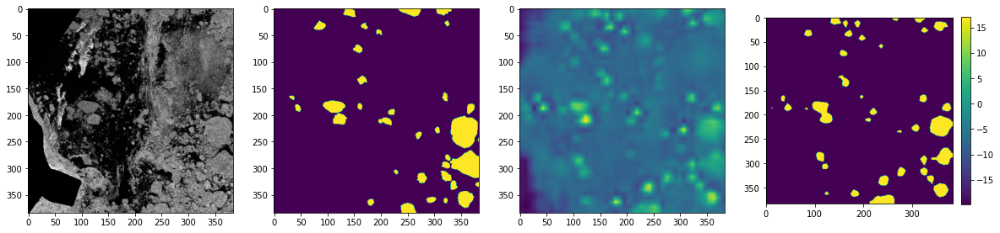

...

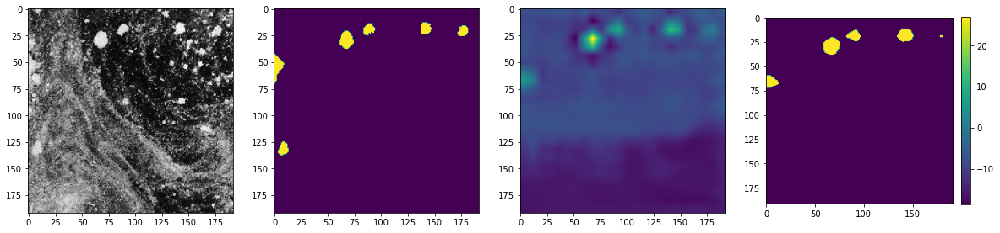

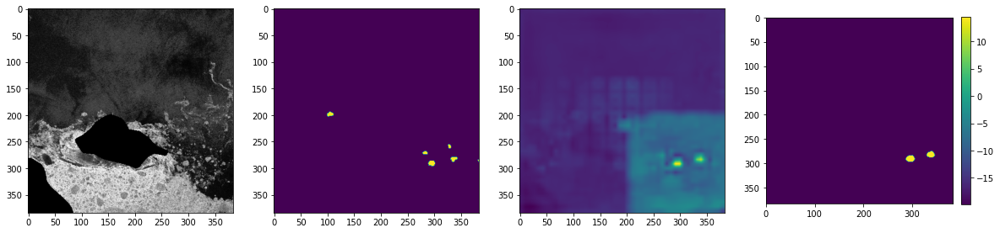

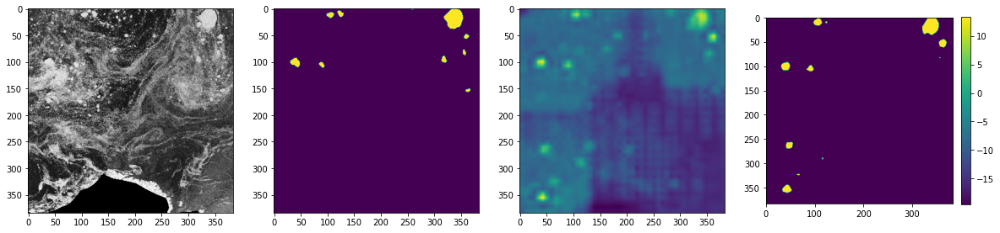

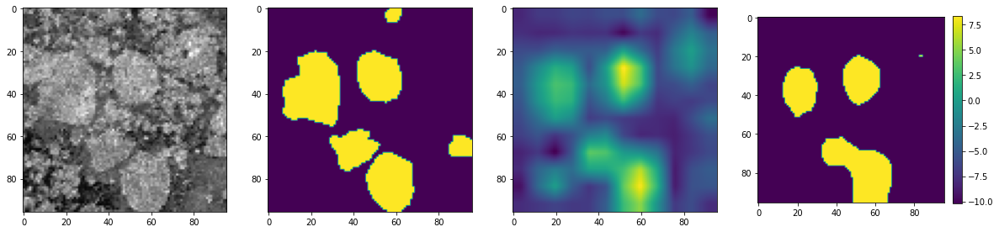

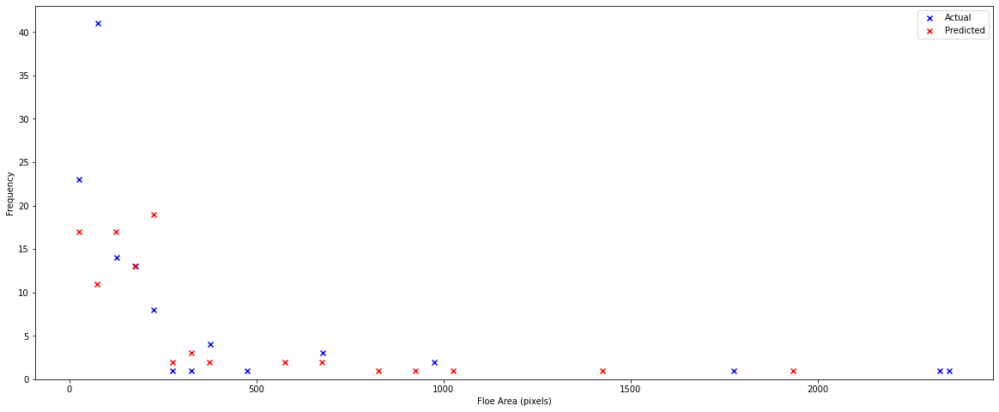

In [41]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Cont_FCN_1000iter_MSE/1_384_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        ax2.set_title("Ground Truth")
        preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
        ax3.colorbar(preds,fraction=0.046, pad=0.04)
        ax4.imshow(pred)
        ax4.set_title("Thresholded Prediction")
        ax3.set_title("Prediction")
        ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_96_DLv3_200iter_MSE.mdl
IoU: 0.5975452615248082
Accuracy: 0.9408440992567273
Precision: 0.5239747604199719
Recall: 0.5045133545082228




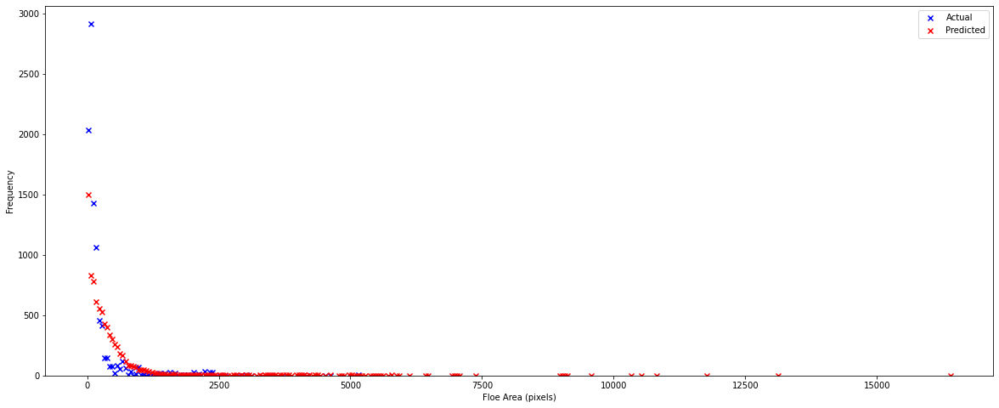

In [40]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Cont_FCN_1000iter_MSE_2/3_384_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

### Multipatch FCN 0.5BCE

Model: 1_96_FCN_best_model_iter_0.5BCE.mdl
IoU: 0.5450063331569621
Accuracy: 0.9501301367488908
Precision: 0.2794499691679113
Recall: 0.25417335824041887




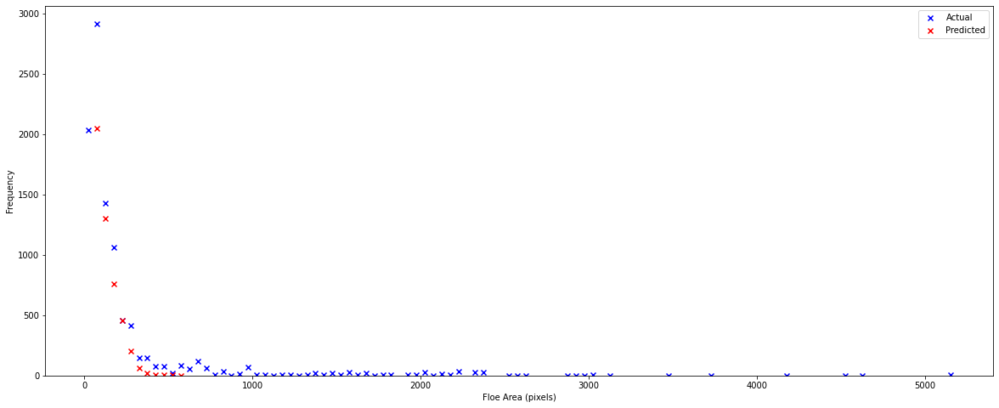

In [42]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_0.5BCE/1_96_FCN_best_model_iter_0.5BCE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_FCN_best_model_iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_192_FCN_best_model_iter_0.5BCE.mdl
IoU: 0.5185794277309238
Accuracy: 0.9559833008566021
Precision: 0.4850067426681558
Recall: 0.10059168924510668




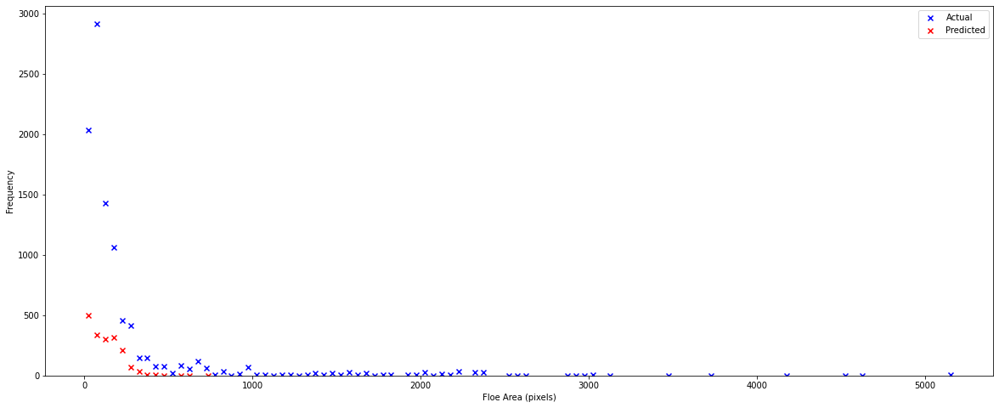

In [43]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_0.5BCE/1_192_FCN_best_model_iter_0.5BCE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_192_FCN_best_model_iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_288_FCN_best_model_iter_0.5BCE.mdl
IoU: 0.6080676962540383
Accuracy: 0.9559189982473114
Precision: 0.5776962939718211
Recall: 0.3615479214867035




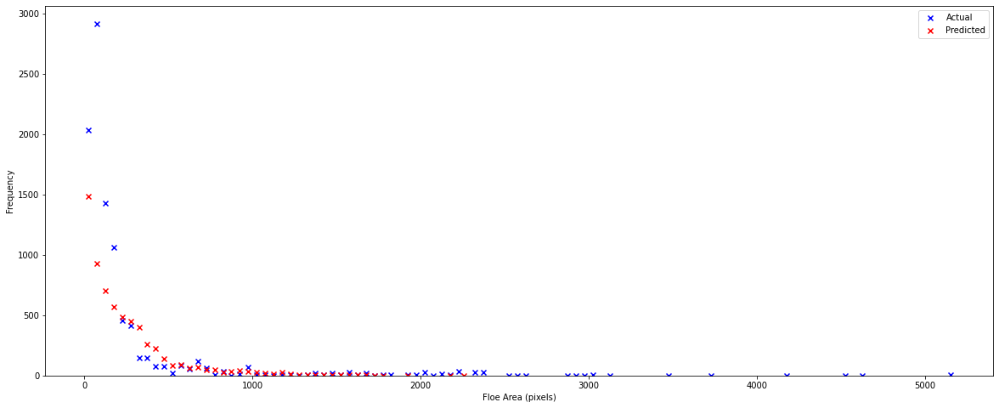

In [44]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_0.5BCE/1_288_FCN_best_model_iter_0.5BCE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_288_FCN_best_model_iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_384_FCN_best_model_iter_0.5BCE.mdl
IoU: 0.6387485005470486
Accuracy: 0.963657102231626
Precision: 0.549521377875752
Recall: 0.37387375190074634




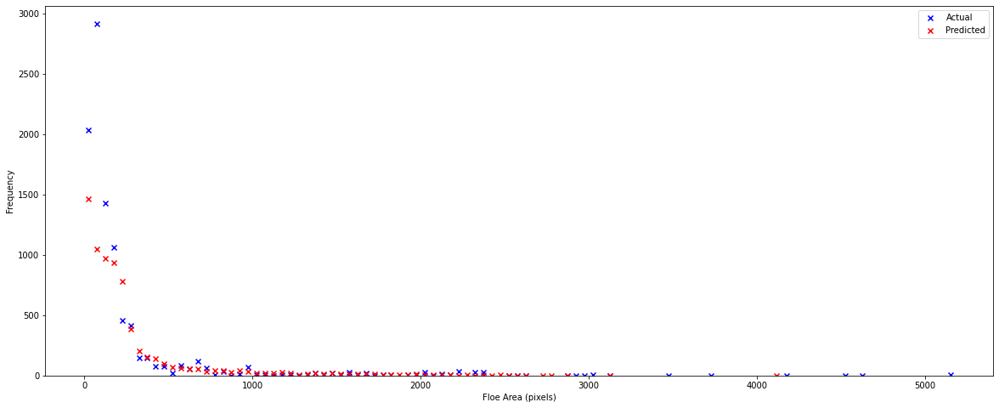

In [45]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_0.5BCE/1_384_FCN_best_model_iter_0.5BCE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_384_FCN_best_model_iter_0.5BCE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_96_FCN_best_model_iter_MSE.mdl
IoU: 0.4695626686879091
Accuracy: 0.8840388074333285
Precision: 0.17154127838125494
Recall: 0.2025617585067309




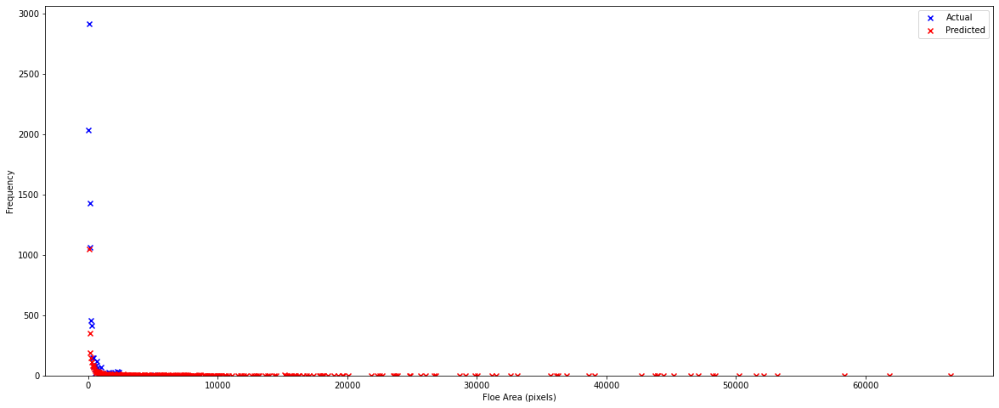

In [54]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_MSE/1_96_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_FCN_best_model_iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_192_FCN_best_model_iter_MSE.mdl
IoU: 0.5703540661098737
Accuracy: 0.9384433708661868
Precision: 0.553032454005115
Recall: 0.31712051386553464




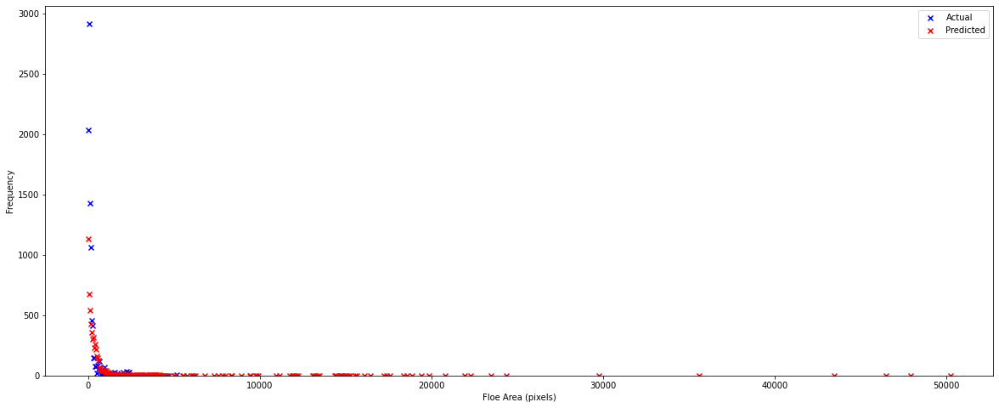

In [51]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_MSE/1_192_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_192_FCN_best_model_iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_288_FCN_best_model_iter_MSE.mdl
IoU: 0.5734348324572204
Accuracy: 0.9167934003288363
Precision: 0.47203155211994496
Recall: 0.5602409395396774




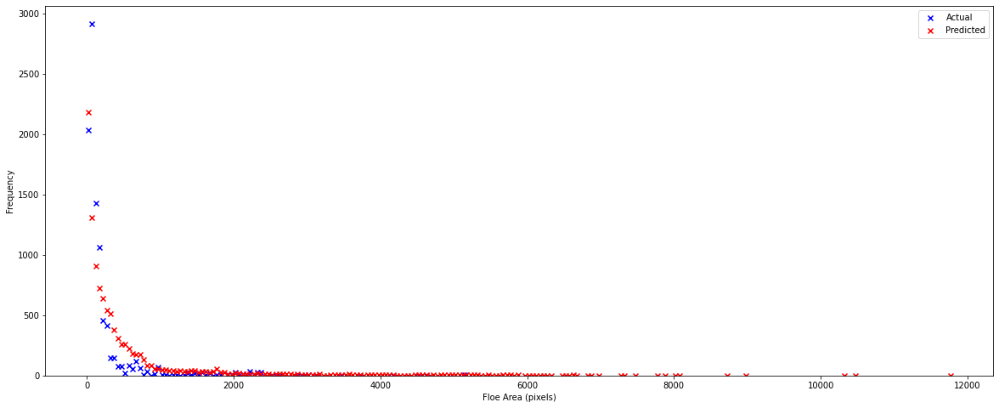

In [52]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_MSE/1_288_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_288_FCN_best_model_iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Model: 1_384_FCN_best_model_iter_MSE.mdl
IoU: 0.6325105273042732
Accuracy: 0.9395805660294897
Precision: 0.5334190266303613
Recall: 0.682768646839624




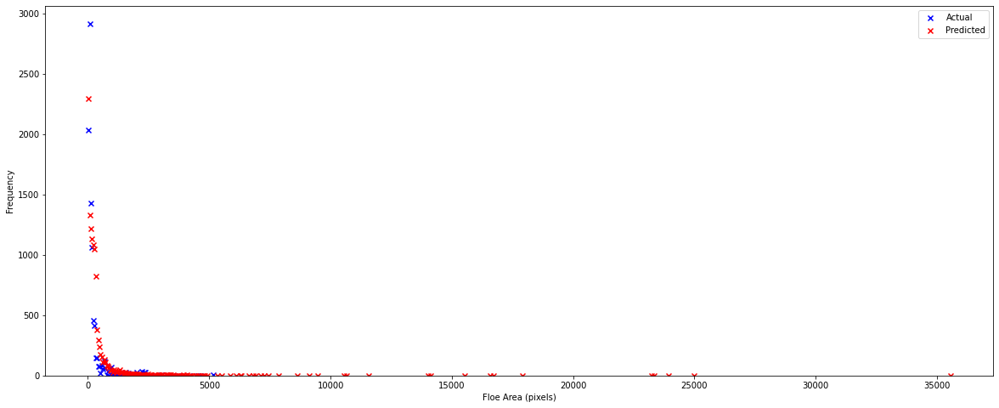

In [8]:
model = models.segmentation.fcn_resnet101(pretrained=True)
model.classifier = FCNHead(2048, 1)
file = torch.load('../model/weights/FCN/Multi_patch_FCN_200iter_MSE/1_384_FCN_best_model_iter_MSE.mdl')
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    ax2.set_title("Ground Truth")
    #    preds = ax4.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax3.imshow(pred)
    #    ax3.set_title("Thresholded Prediction")
    #    ax4.set_title("Prediction")
    #    ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_384_FCN_best_model_iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## Deep Lab V3

In [5]:
# 96 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_96_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

# 192 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_192_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_192_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

# 288 patch model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_288_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        ax2.set_title("Ground Truth")
        preds = ax4.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
        plt.colorbar(preds,fraction=0.046, pad=0.04)
        ax3.imshow(pred)
        ax3.set_title("Thresholded Prediction")
        ax4.set_title("Prediction")
        ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: 1_28_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

# 384 patch
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_384_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_384_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_96_DLv3_200iter_MSE.mdl
IoU: 0.47643083378891177
Accuracy: 0.9528616615577981
Precision: 0.0
Recall: 0.0




ValueError: zero-size array to reduction operation minimum which has no identity

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_96_DLv3_200iter_MSE.mdl
IoU: 0.5019875458449415
Accuracy: 0.935639626516905
Precision: 0.19696956313142214
Recall: 0.020779219257885104




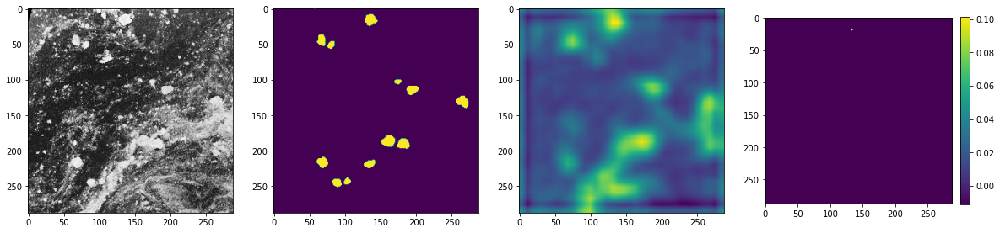

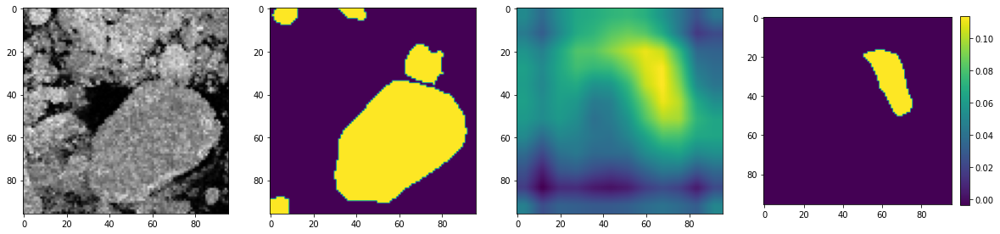

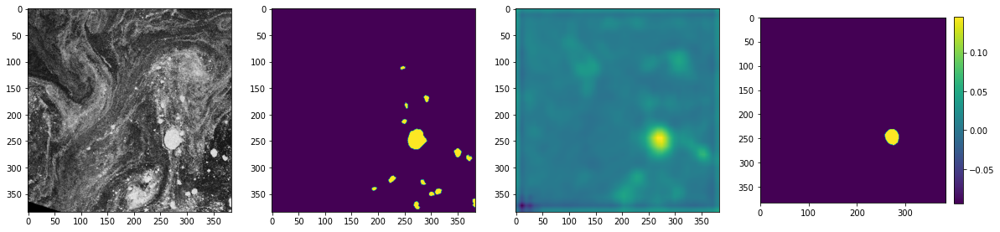

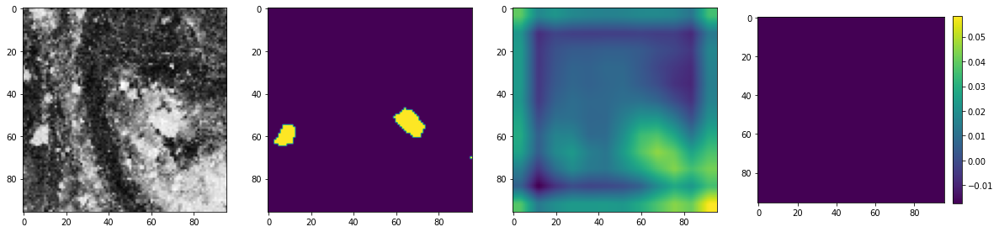

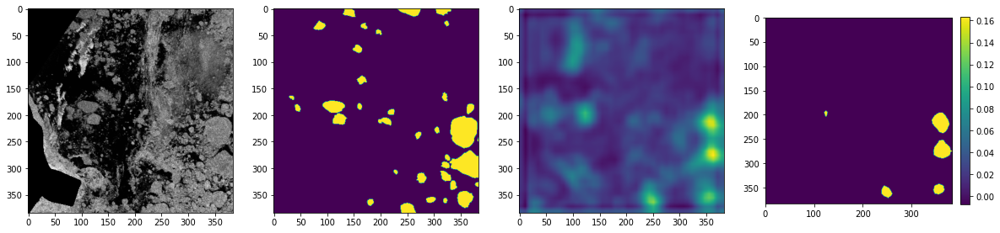

...

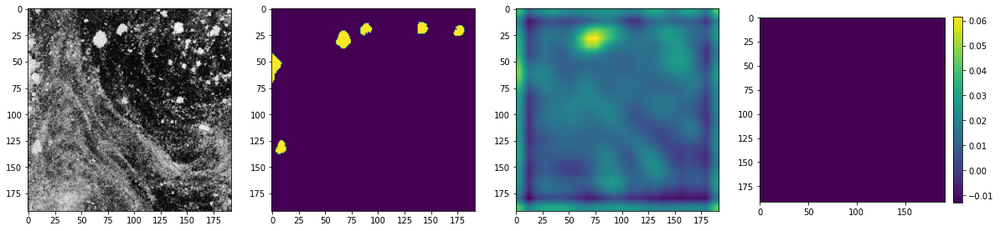

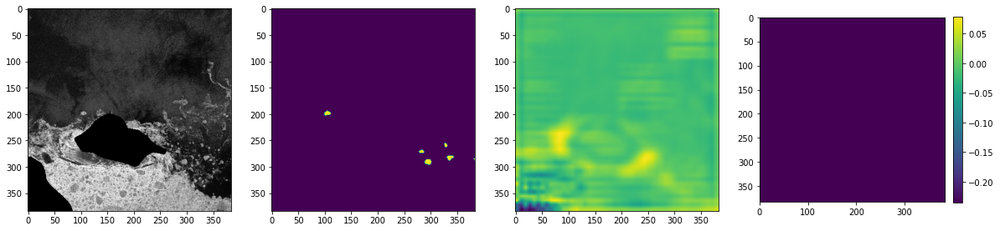

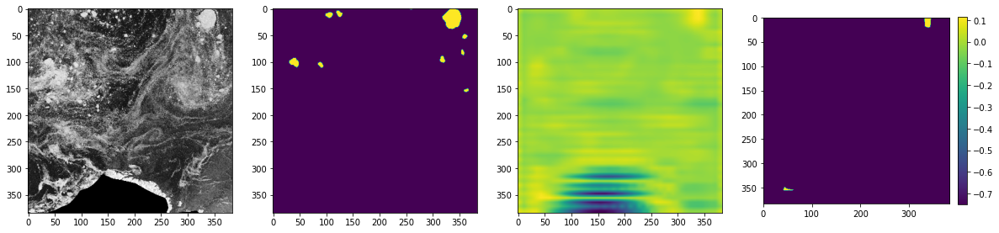

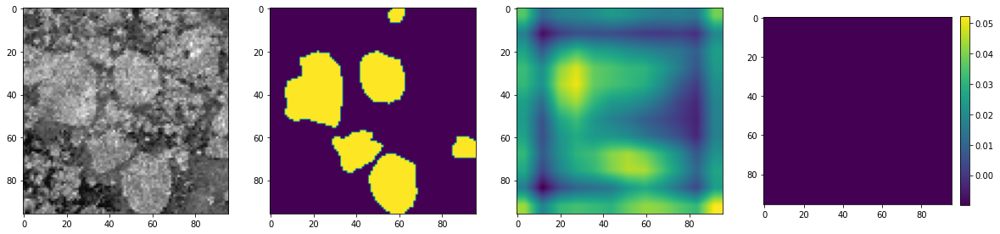

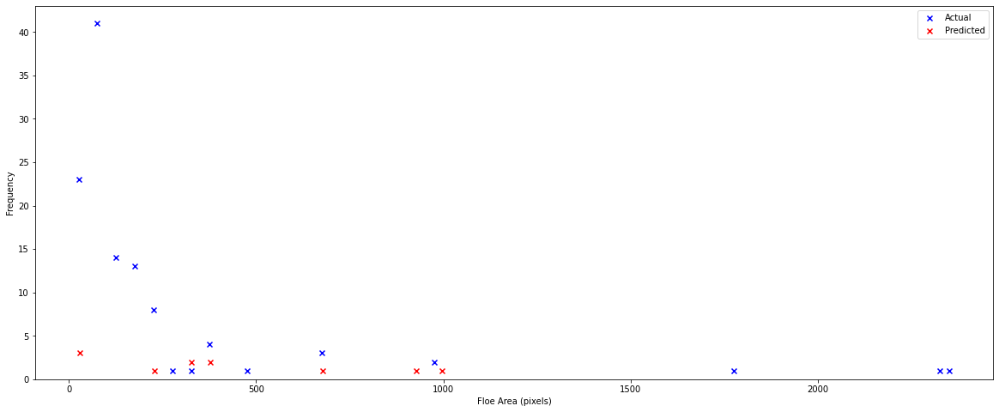

In [10]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_96_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.1)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
        plt.colorbar(preds,fraction=0.046, pad=0.04)
        ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: 1_96_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_192_DLv3_200iter_MSE.mdl
IoU: 0.5527518577829358
Accuracy: 0.9556501704086492
Precision: 0.4949041082759409
Recall: 0.21209767092420484




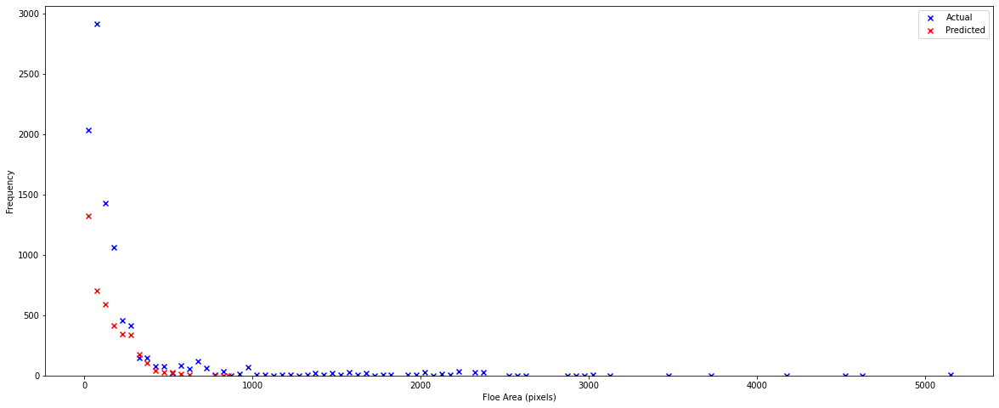

In [14]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_192_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_192_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_28_DLv3_200iter_MSE.mdl
IoU: 0.6236280941206281
Accuracy: 0.96449528541094
Precision: 0.5687553502877869
Recall: 0.3348130644696081




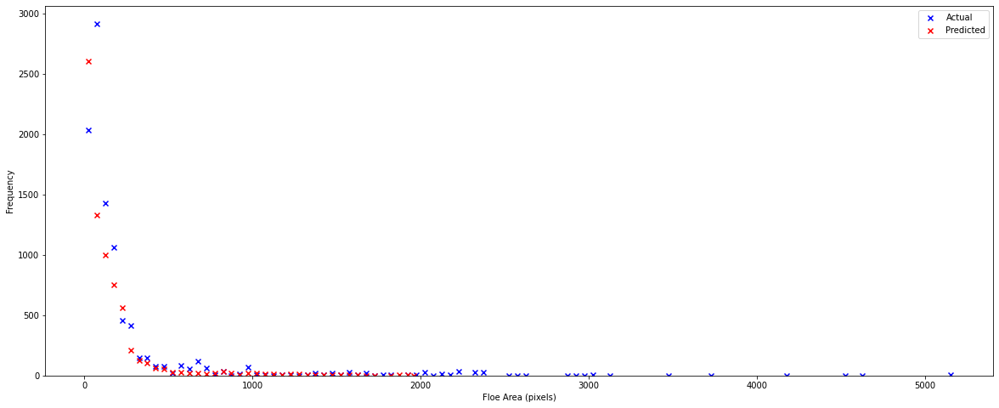

In [13]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_288_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: 1_28_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: 1_384_DLv3_200iter_MSE.mdl
IoU: 0.6723251264478659
Accuracy: 0.9596984383768238
Precision: 0.5732381496764408
Recall: 0.5243187433192786




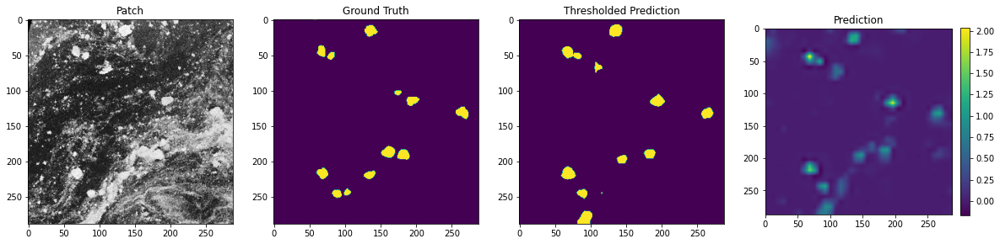

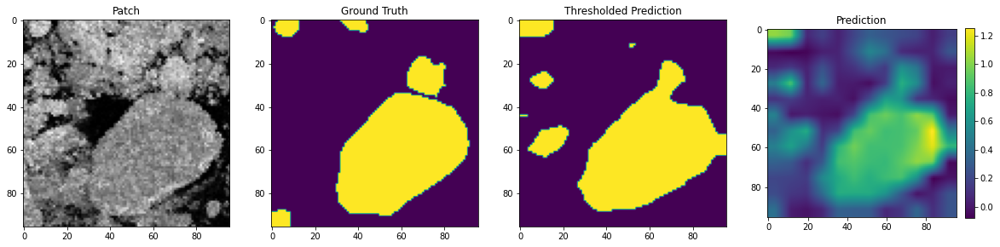

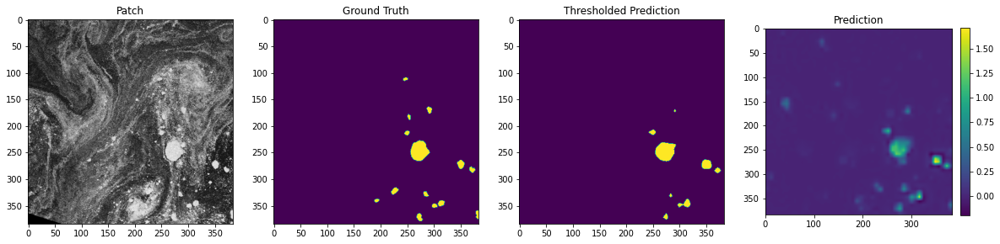

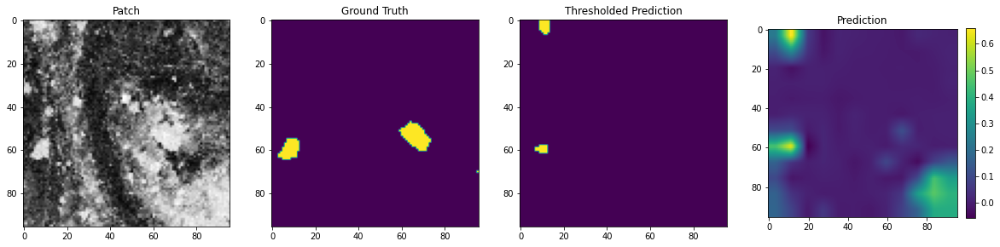

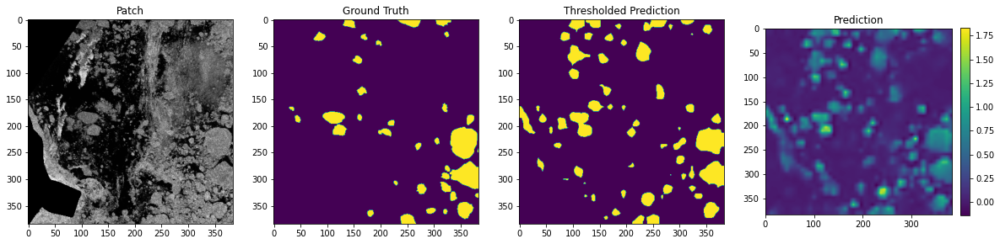

...

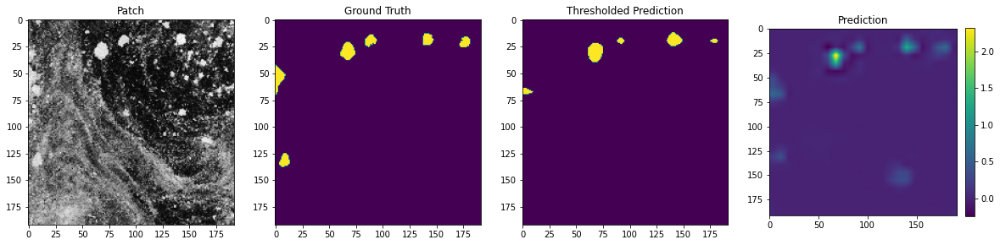

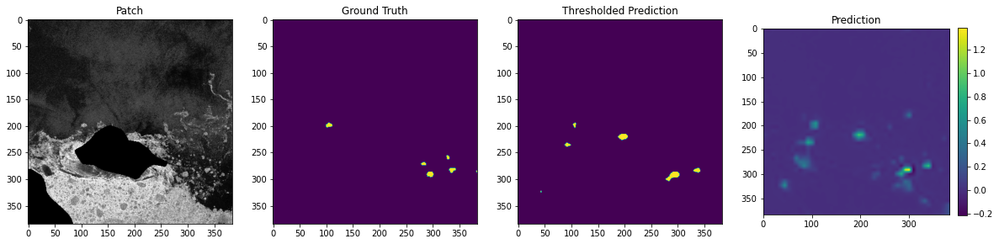

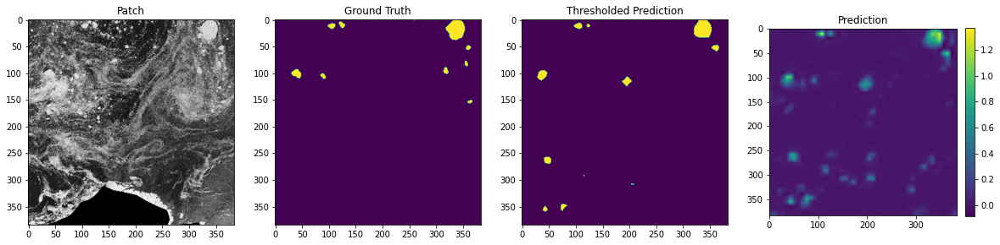

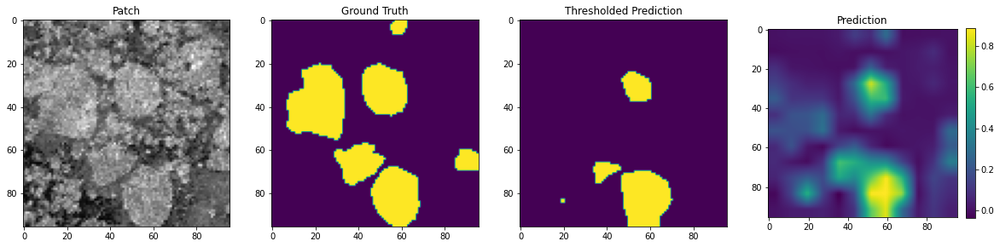

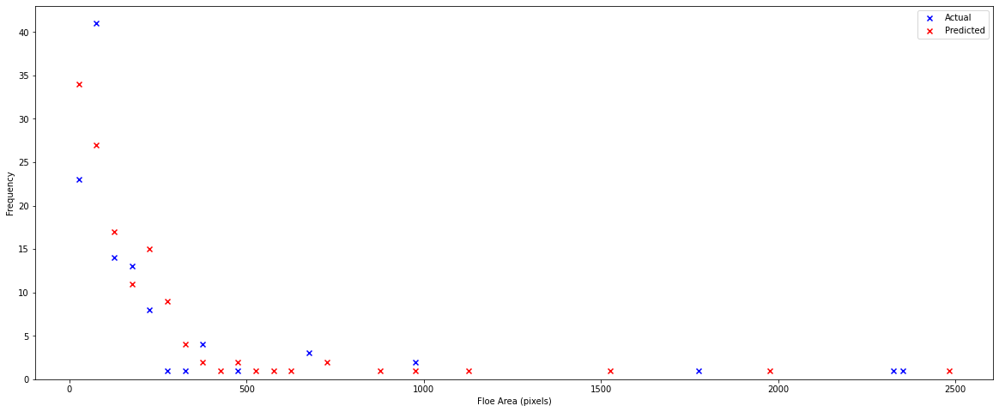

In [9]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/1_384_DLv3_200iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        ax2.set_title("Ground Truth")
        preds = ax4.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
        plt.colorbar(preds,fraction=0.046, pad=0.04)
        ax3.imshow(pred)
        ax3.set_title("Thresholded Prediction")
        ax4.set_title("Prediction")
        ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: 1_384_DLv3_200iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: DLv3_650iter_0.5bce.mdl
IoU: 0.619708604544225
Accuracy: 0.9597785704812887
Precision: 0.5785898309459546
Recall: 0.336645580269295




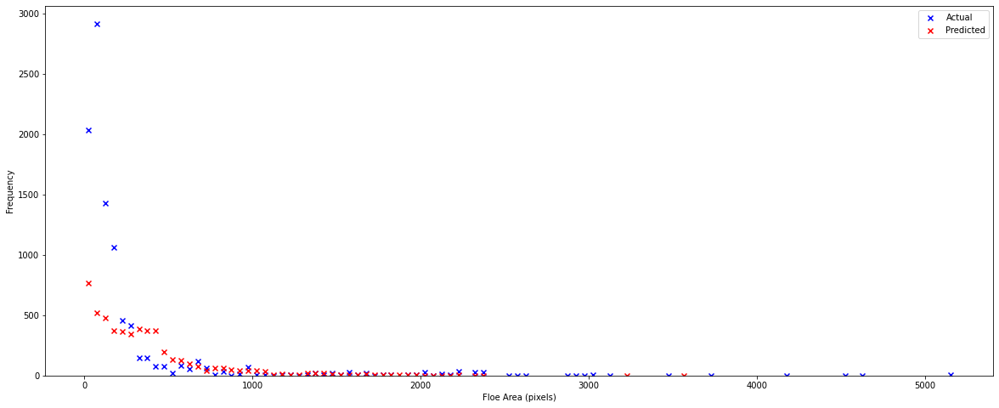

In [3]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/DLv3_650iter_0.5bce.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: DLv3_650iter_0.5bce.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

Using cache found in /home/dsola/.cache/torch/hub/pytorch_vision_v0.5.0


Model: DLv3_650iter_MSE.mdl
IoU: 0.6682326063364039
Accuracy: 0.9664410023630401
Precision: 0.6316098390777589
Recall: 0.45054731789507074




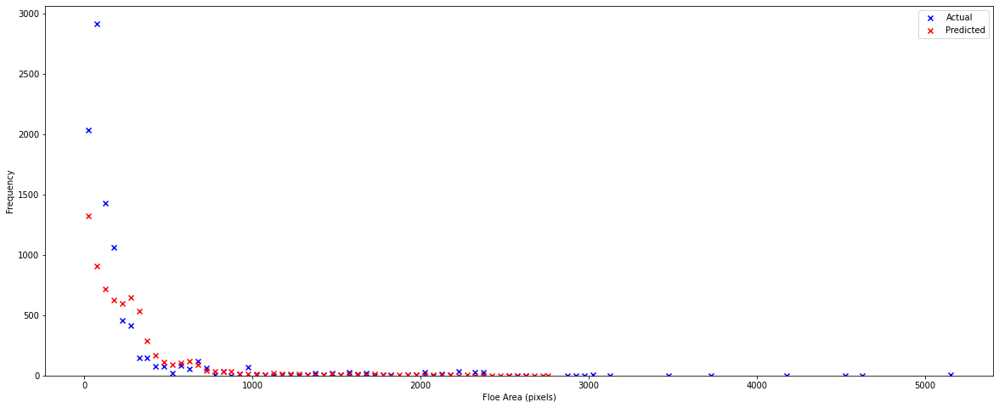

In [4]:
model = torch.hub.load('pytorch/vision:v0.5.0', 'deeplabv3_resnet101', pretrained=True)
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.classifier = DeepLabHead(2048, 1)
model.load_state_dict(torch.load('../model/weights/DLv3/DLv3_650iter_MSE.mdl')['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)['out'][0, 0, :, :].cpu().detach().numpy() > 0.5)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)['out'][0, 0, :, :].cpu().detach().numpy())
    #    plt.colorbar(preds,fraction=0.046, pad=0.04)
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 10:
    #    break

    
print('Model: DLv3_650iter_MSE.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## Lovasz

Model: test_119900it_50wt_BatchNormYes.model
IoU: 0.4685460004898277
Accuracy: 0.9322965988005052
Precision: 0.018181814545455272
Recall: 0.09090900000009092




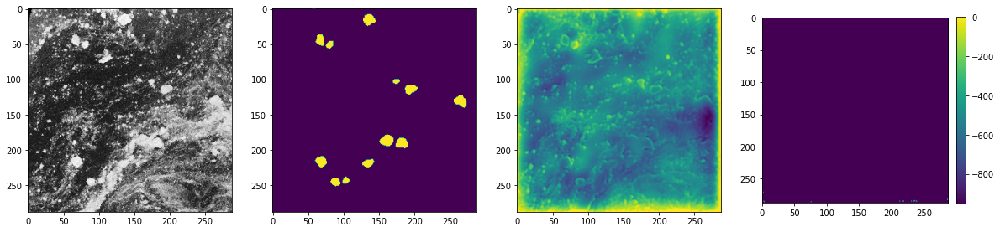

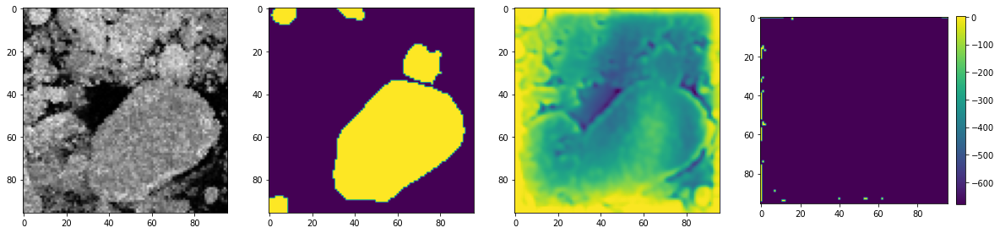

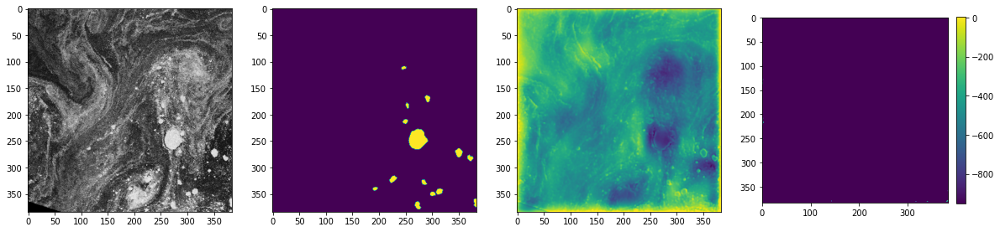

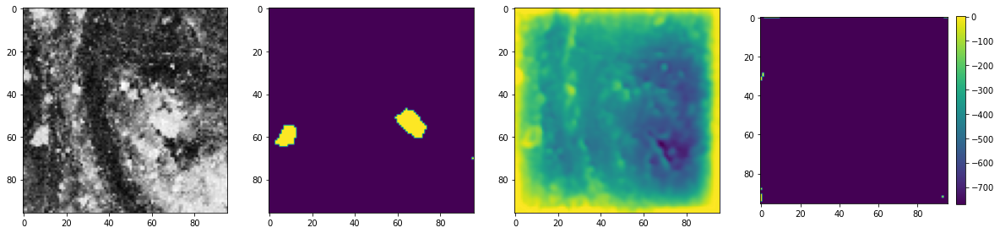

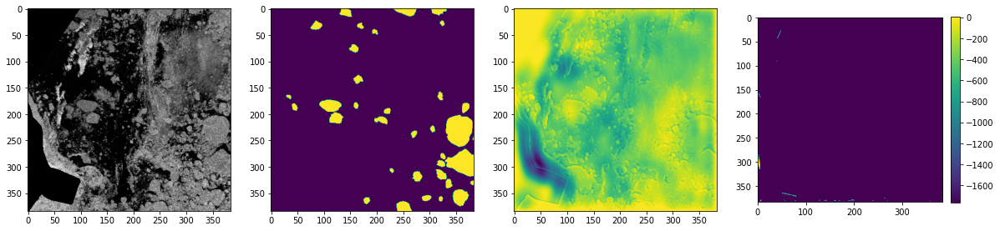

...

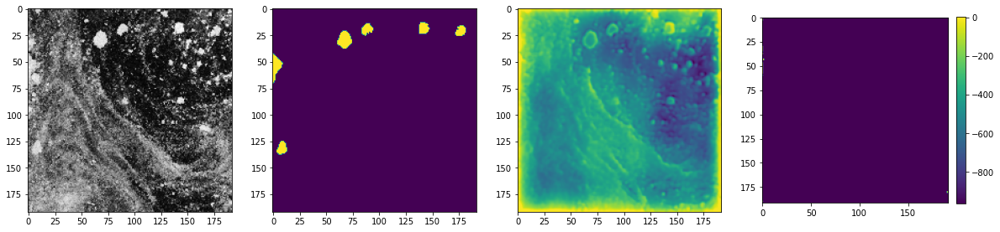

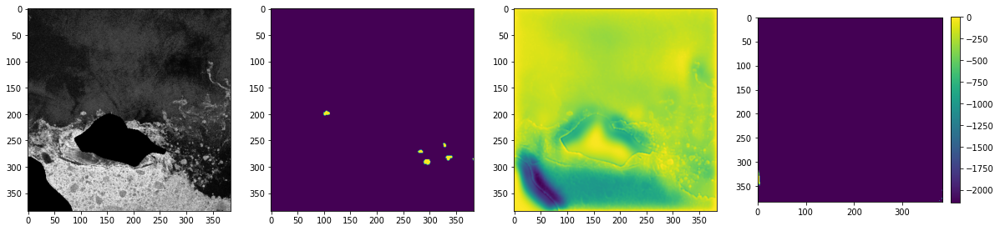

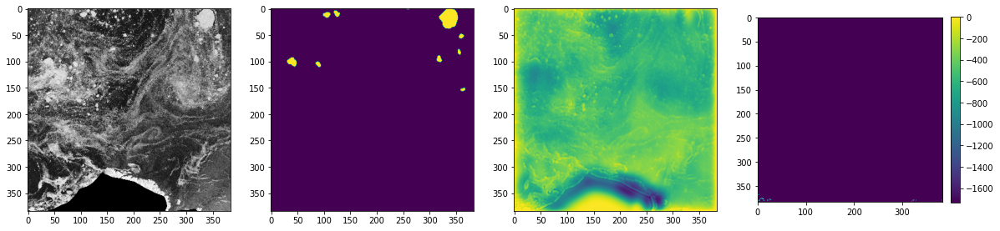

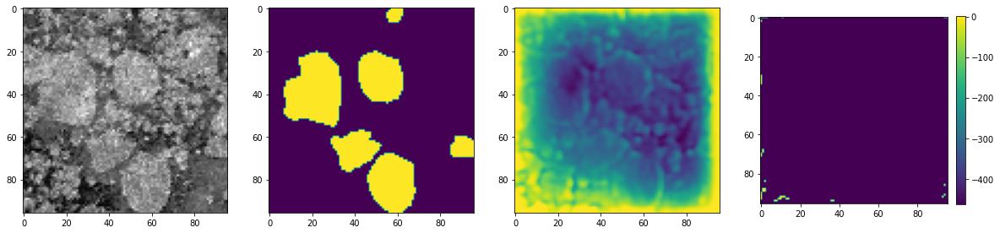

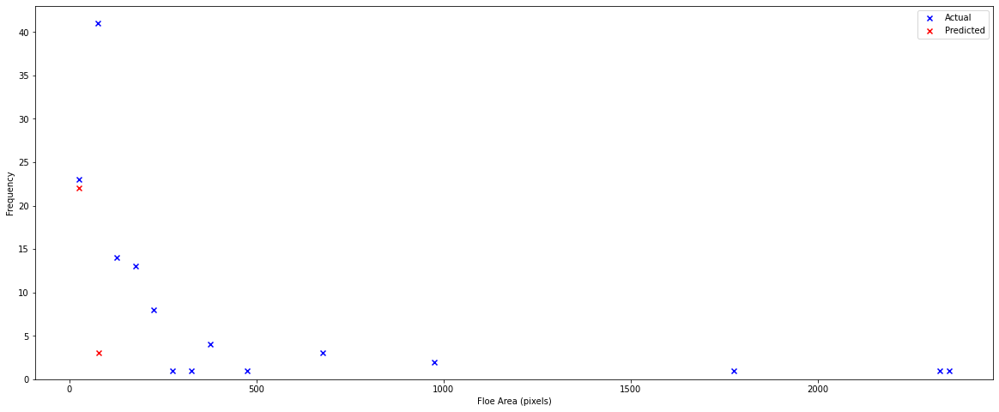

In [9]:
file = torch.load('../model/weights/Unet/march_20_lovasz_0.5.mdl')
model = arc.UNet(1)
model.load_state_dict(file['state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0].astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
        plt.colorbar(preds,fraction=0.046, pad=0.04)
        ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: test_119900it_50wt_BatchNormYes.model')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## Standard UNet

Model: test_119900it_50wt_BatchNormYes.model
IoU: 0.7219976136016378
Accuracy: 0.9633031431940938
Precision: 0.810771497633145
Recall: 0.4468295769267803




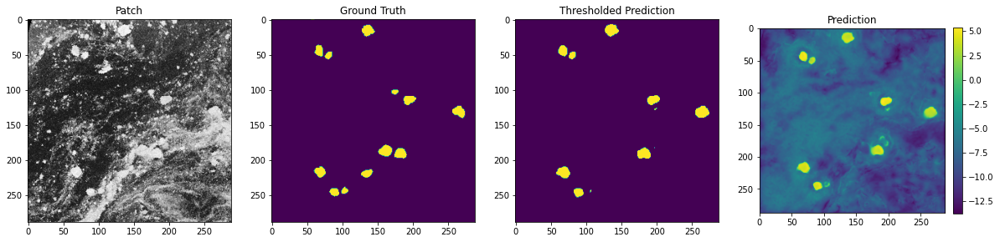

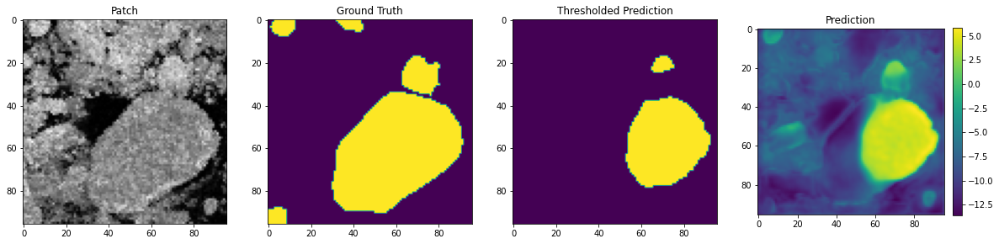

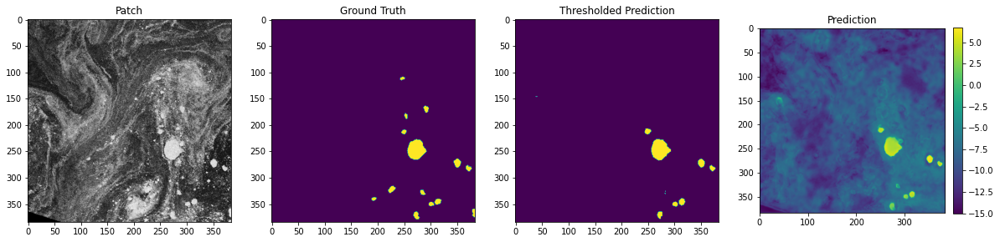

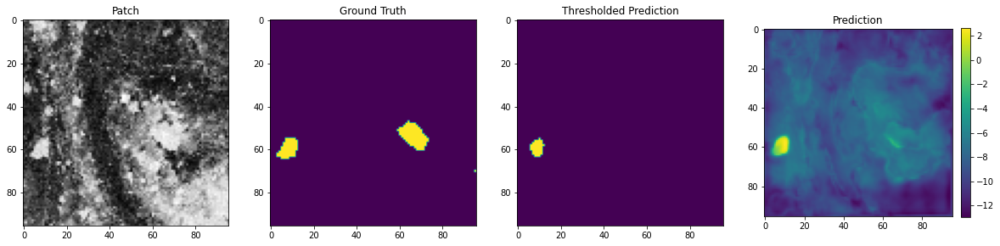

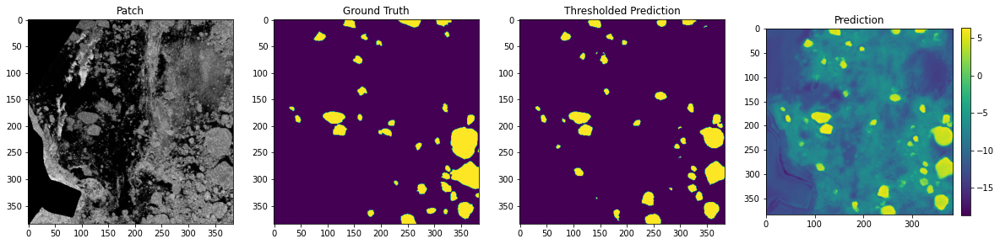

...

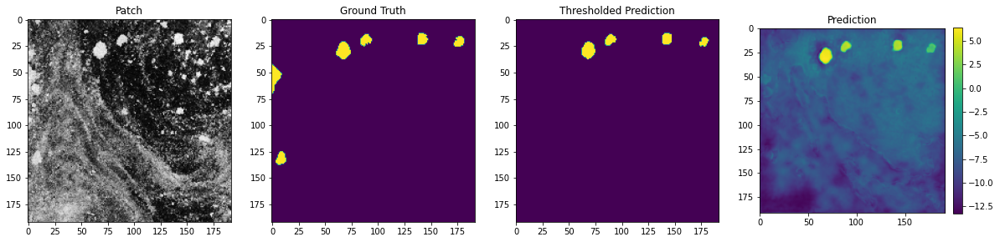

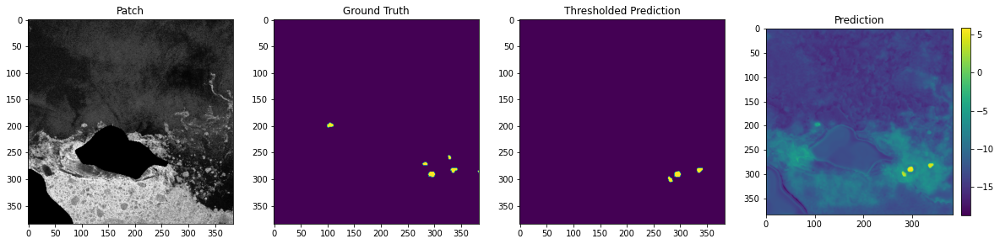

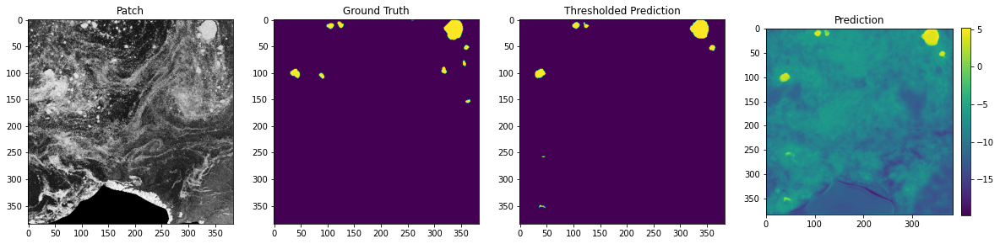

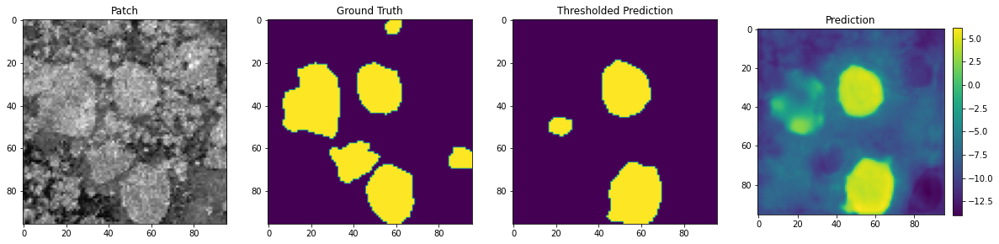

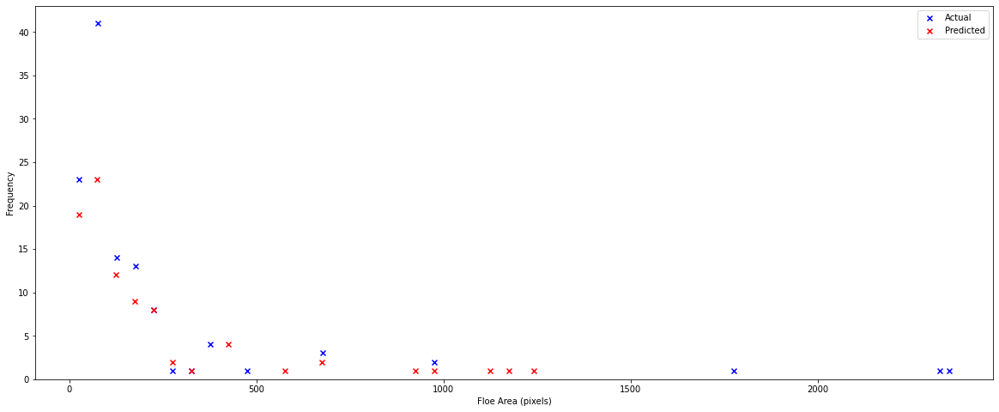

In [7]:
file = torch.load('/media/dsola/4C348F75348F6136/Users/solad/floe/models/test_119900it_50wt_BatchNormYes.model')
model = arc.UNet(1)
model.load_state_dict(file['model_state_dict'])
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    X = X[:,:,0].astype(np.float32)
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
        ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
        ax2.imshow(y)
        ax2.set_title("Ground Truth")
        preds = ax4.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
        plt.colorbar(preds,fraction=0.046, pad=0.04)
        ax3.imshow(pred)
        ax3.set_title("Thresholded Prediction")
        ax4.set_title("Prediction")
        ax1.set_title("Patch")
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    if batch_idx == 10:
        break

    
print('Model: test_119900it_50wt_BatchNormYes.model')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()

## ResUNet

Model: 96_SD.mdl
IoU: 0.5462231276326542
Accuracy: 0.9491416008089795
Precision: 0.2884136000402088
Recall: 0.23062601914286276




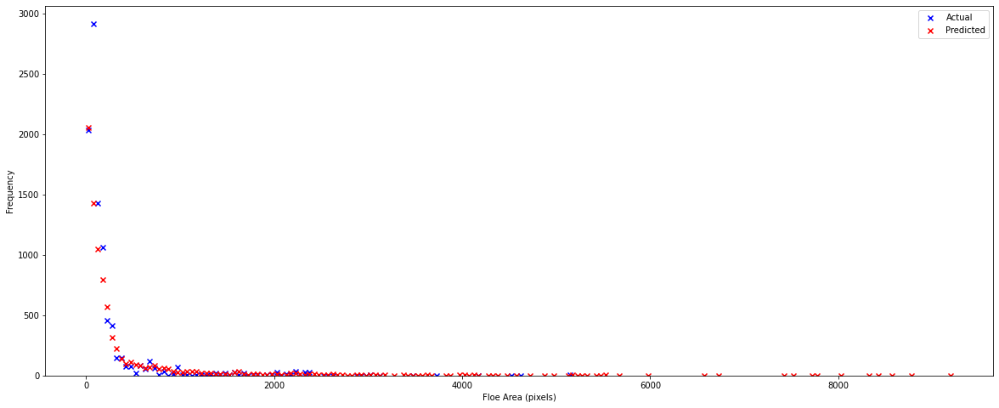

In [5]:
file = torch.load('../model/weights/ResUNet/96_SD.mdl')
resnet = models.resnet34(pretrained=True)
layers = list(resnet.children())         
model = arc.ResUNet(layers, 1)
model.load_state_dict(file)
model.eval()
model.cuda()
path_images = '../data/valid_premade_patches_multi/image_patches/'
path_masks = '../data/valid_premade_patches_multi/mask_patches/'
#path_images = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/image_patches/'
#path_masks = '/media/dsola/4C348F75348F6136/Users/solad/floe/parsing/U-Net/validation/mask_patches/'
img_names = os.listdir(path_images)
msk_names = os.listdir(path_masks)
mIoUs, mAccs, pres, recs = [], [], [], []
areas_mask_final, areas_pred_final = [], []

for batch_idx in range(len(img_names)):
    X = mpimg.imread(path_images + img_names[batch_idx])
    #print("before: ", np.max(X), np.min(X))
    #X = X[:,:,0].astype(np.float32)
    #X = -(X) + 255
    X = X[:, :, :3]
    #X = X * 255
    #print("after: ", np.max(X), np.min(X))
    #X = np.array(X[:, :, 0])
    X = TF.to_tensor(X).unsqueeze(0).cuda()
    #print(X.shape)
    y = Image.open(path_masks + msk_names[batch_idx])
    y = np.array(y).astype(bool)
    #X = X[:,0,:,:].unsqueeze(1)
    pred = (model(X)[0, 0, :, :].cpu().detach().numpy() > 0)
    #print(y, pred)
    #if True:#batch_idx == 4 or batch_idx == 5 or batch_idx == 6 or batch_idx == 7:
    #    fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,20))
    #    ax1.imshow(X[0, 0, :, :].cpu().detach().numpy(), cmap='gray')
    #    ax2.imshow(y)
    #    preds = ax3.imshow(model(X)[0, 0, :, :].cpu().detach().numpy())
    #    ax4.imshow(pred)
    pre, rec = met.precision_recall(y, pred)
    mIoUs.append(met.mIoU(y, pred))
    mAccs.append(met.mAcc(y, pred))
    pres.append(pre)
    recs.append(rec)
    
    _, areas_mask = met.get_centres(y, get_areas=True)
    _, areas_pred = met.get_centres(pred, get_areas=True)

    areas_mask_final += list(areas_mask)
    areas_pred_final += list(areas_pred)
    #plt.colorbar(preds,fraction=0.046, pad=0.04)
    #preds.set_clim(-6,6)
    #if batch_idx == 0:
    #    break

    
print('Model: 96_SD.mdl')    
print("IoU: {}".format(np.mean(mIoUs)))
print("Accuracy: {}".format(np.mean(mAccs)))
print("Precision: {}".format(np.mean(pres)))
print("Recall: {}".format(np.mean(recs)))
print("\n")
bin_size = 50
bins_x_mask, bins_y_mask = fsd.make_bins(areas_mask_final, bin_size)
bins_x_pred, bins_y_pred = fsd.make_bins(areas_pred_final, bin_size)
fig, ax = plt.subplots(figsize=(20,8))
fsd.plot_FSD(bins_x_mask, bins_y_mask, ax, data_type='Actual')
fsd.plot_FSD(bins_x_pred, bins_y_pred, ax, color='r', data_type='Predicted')
plt.legend()
plt.show()